# Traffic Flow Volume Prediction  



# Exploratory Data Analysis

Dataset Information: Hourly Interstate 94 Westbound traffic volume for MN DoT ATR station 301, roughly midway between Minneapolis and St Paul, MN.

In [2]:
import numpy as np
import pandas as pd
import matplotlib.pyplot as plt
import seaborn as sns
from sklearn.preprocessing import LabelEncoder

# Read the Dataset
tv_df = pd.read_csv("Metro_Interstate_Traffic_Volume.csv").sort_values(by='date_time')

tv_df.info()
print()
tv_df.describe()
print()
tv_df.describe(include='object')


<class 'pandas.core.frame.DataFrame'>
Int64Index: 48204 entries, 0 to 48203
Data columns (total 9 columns):
 #   Column               Non-Null Count  Dtype  
---  ------               --------------  -----  
 0   holiday              48204 non-null  object 
 1   temp                 48204 non-null  float64
 2   rain_1h              48204 non-null  float64
 3   snow_1h              48204 non-null  float64
 4   clouds_all           48204 non-null  int64  
 5   weather_main         48204 non-null  object 
 6   weather_description  48204 non-null  object 
 7   date_time            48204 non-null  object 
 8   traffic_volume       48204 non-null  int64  
dtypes: float64(3), int64(2), object(4)
memory usage: 3.7+ MB




,holiday,weather_main,weather_description,date_time
count,48204,48204,48204,48204
unique,12,11,38,40575
top,None,Clouds,sky is clear,2013-05-19 10:00:00
freq,48143,15164,11665,6


In [3]:
tv_df.isnull().sum().to_frame(name="Missing value").T

,holiday,temp,rain_1h,snow_1h,clouds_all,weather_main,weather_description,date_time,traffic_volume
Missing value,0,0,0,0,0,0,0,0,0


There are no missing values. So, imputation is unnecessary

In [4]:
dupicate_data = tv_df[tv_df.duplicated(keep=False)]
dupicate_data

,holiday,temp,rain_1h,snow_1h,clouds_all,weather_main,weather_description,date_time,traffic_volume
18696,None,286.290,0.0,0.0,1,Clear,sky is clear,2015-09-30 19:00:00,3679
18697,None,286.290,0.0,0.0,1,Clear,sky is clear,2015-09-30 19:00:00,3679
23851,None,289.060,0.0,0.0,90,Clouds,overcast clouds,2016-06-01 10:00:00,4831
23850,None,289.060,0.0,0.0,90,Clouds,overcast clouds,2016-06-01 10:00:00,4831
26783,None,289.775,0.0,0.0,56,Clouds,broken clouds,2016-09-21 15:00:00,5365
26784,None,289.775,0.0,0.0,56,Clouds,broken clouds,2016-09-21 15:00:00,5365
26979,None,287.860,0.0,0.0,0,Clear,Sky is Clear,2016-09-29 19:00:00,3435
26980,None,287.860,0.0,0.0,0,Clear,Sky is Clear,2016-09-29 19:00:00,3435
27171,None,279.287,0.0,0.0,56,Clouds,broken clouds,2016-10-07 18:00:00,4642
27170,None,279.287,0.0,0.0,56,Clouds,broken clouds,2016-10-07 18:00:00,4642


Removing the duplicates in (date_time)

In [5]:
tv_df.drop_duplicates(subset="date_time", keep="first", inplace=True)
tv_df.reset_index(drop=True, inplace=True)
tv_df.shape

(40575, 9)

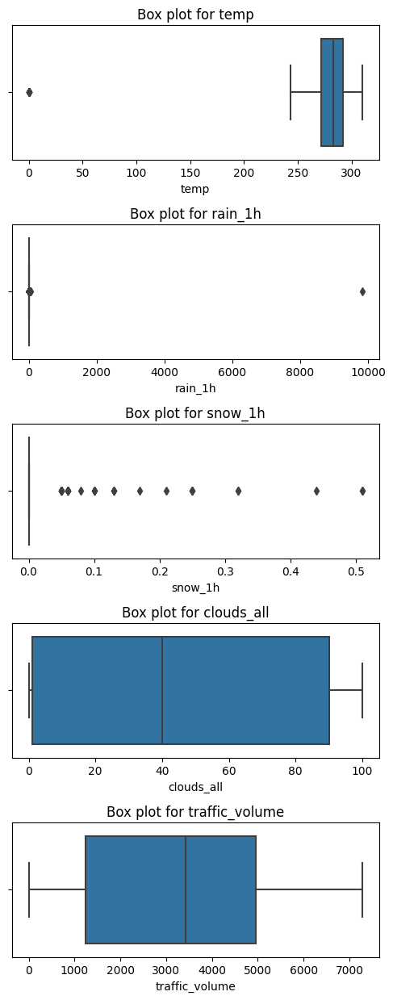

In [6]:
def plot_box(df):
    numeric_columns = tv_df.select_dtypes(include='number').columns
    num_features = len(numeric_columns)
    fig, axs = plt.subplots(num_features, 1, figsize=(5, num_features * 2.5))

    # Generate Box plot for each attribute to check for outliers
    for index, column in enumerate(numeric_columns):
        sns.boxplot(x=tv_df[column], ax=axs[index])
        axs[index].set_title(f'Box plot for {column}')

    plt.tight_layout()
    plt.show()

# Function to remove outliers from a DataFrame column based on the IQR method
def remove_outliers_iqr(df, column_name):
    Q1 = df[column_name].quantile(0.25)
    Q3 = df[column_name].quantile(0.75)
    IQR = Q3 - Q1
    lower_bound = Q1 - 1.5*IQR
    upper_bound = Q3 + 1.5*IQR

    # Filter the DataFrame to only include rows where the specified column's value is within the acceptable range
    return df[(df[column_name] >= lower_bound) & (df[column_name] <= upper_bound)]

plot_box(tv_df)


Removing outliers present in rain_1h and temp

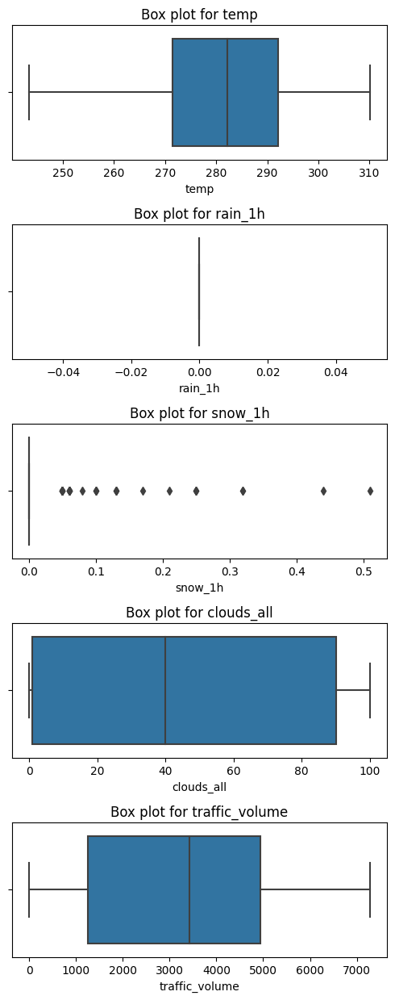

In [7]:
tv_df = remove_outliers_iqr(tv_df, 'temp')
tv_df = remove_outliers_iqr(tv_df, 'rain_1h')

plot_box(tv_df)

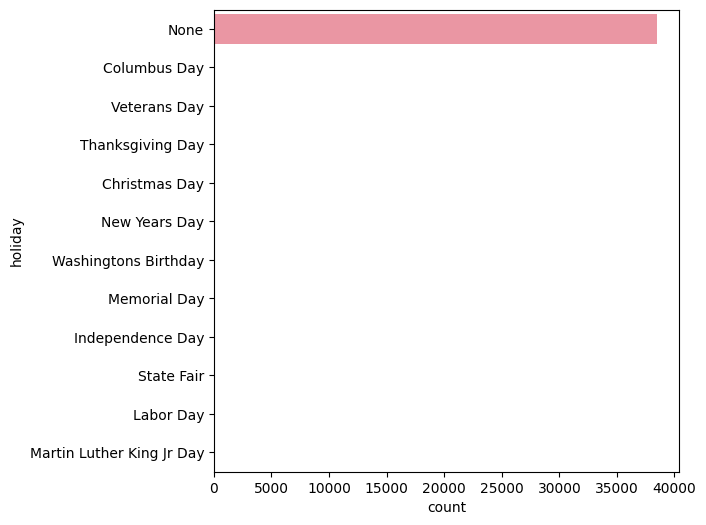

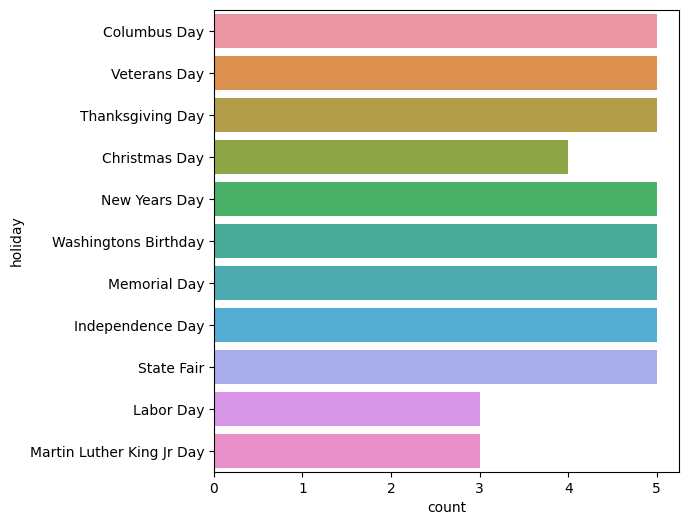

In [8]:
plt.figure(figsize = (6,6))
sns.countplot(y = tv_df['holiday'], data = tv_df)
plt.show()
print()
plt.figure(figsize = (6,6))
df = tv_df[tv_df['holiday'] != 'None']
sns.countplot(y = df['holiday'], data = tv_df)
plt.show()


# Data Augmentation

In [9]:
# Extract various time-related features (year, month, day, hour, weekday, day_of_week, date) from the 'date_time' column in the 'tv_df' DataFrame
tv_df['date_time'] = pd.to_datetime(tv_df['date_time'])
tv_df['year'] = tv_df['date_time'].dt.year
tv_df['month'] = tv_df['date_time'].dt.month
tv_df['day'] = tv_df['date_time'].dt.day
tv_df['hour'] = tv_df['date_time'].dt.hour
tv_df['weekday'] = tv_df['date_time'].dt.weekday
tv_df['day_of_week'] = tv_df['date_time'].dt.dayofweek
tv_df["date"] = tv_df["date_time"].dt.date

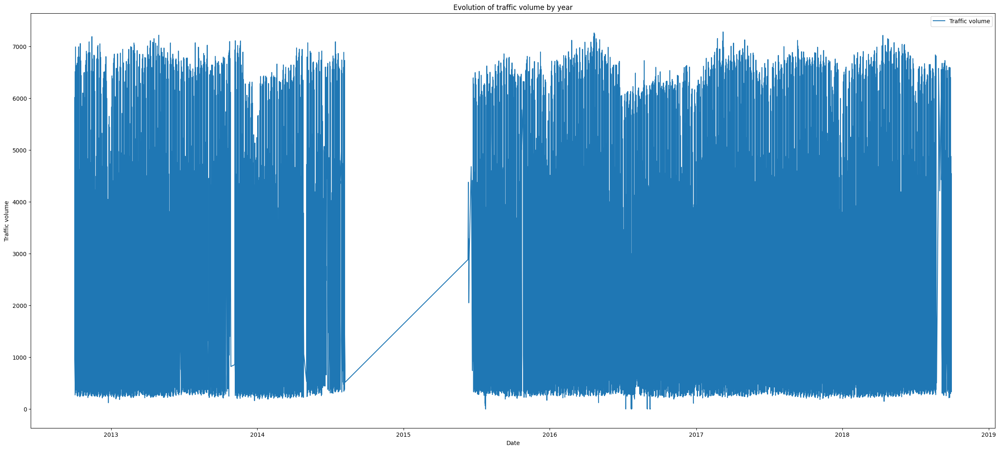

In [10]:
# Traffic Volume per year Plot
fig = plt.figure(figsize=(30, 13))
plt.subplot(1, 1, 1)
plt.plot(tv_df['date_time'].dt.date, tv_df["traffic_volume"], label="Traffic volume")
plt.title("Evolution of traffic volume by year")
plt.xlabel("Date")
plt.ylabel("Traffic volume")
plt.legend(loc="best")
plt.xticks(rotation=0)
plt.subplots_adjust(hspace=0.3)
plt.show()

The models in the future sections have been trained on both the datasets (including the records with dip and excluding them). Including the dip has given overall better performance.

> The dip could be occuring due to a change in road infrastructure or road construction



Run this code to include only records only from the date 2016-01-01

In [11]:
tv_df_filtered = tv_df[tv_df['date_time'] >= '2016-01-01 00:00:00']
tv_df_filtered.head()

,holiday,temp,rain_1h,snow_1h,clouds_all,weather_main,weather_description,date_time,traffic_volume,year,month,day,hour,weekday,day_of_week,date
17491,New Years Day,265.94,0.0,0.0,90,Haze,haze,2016-01-01 00:00:00,1513,2016,1,1,0,4,4,2016-01-01
17492,None,266.00,0.0,0.0,90,Snow,light snow,2016-01-01 01:00:00,1550,2016,1,1,1,4,4,2016-01-01
17493,None,266.01,0.0,0.0,90,Snow,light snow,2016-01-01 03:00:00,719,2016,1,1,3,4,4,2016-01-01
17494,None,264.80,0.0,0.0,90,Clouds,overcast clouds,2016-01-01 04:00:00,533,2016,1,1,4,4,4,2016-01-01
17495,None,264.38,0.0,0.0,90,Clouds,overcast clouds,2016-01-01 05:00:00,586,2016,1,1,5,4,4,2016-01-01


In [150]:
tv_df = tv_df_filtered

plot after excluding the data with dip

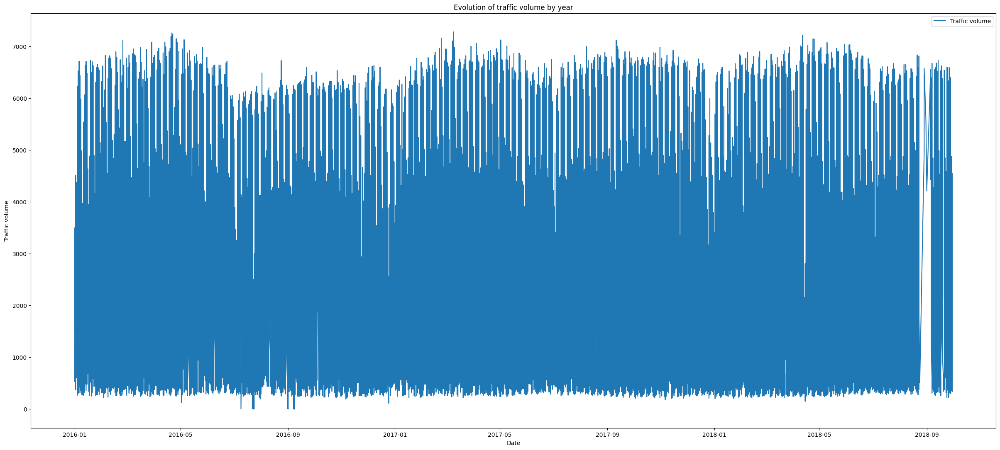

In [151]:
fig = plt.figure(figsize=(30, 13))
plt.subplot(1, 1, 1)
plt.plot(tv_df['date_time'].dt.date, tv_df["traffic_volume"], label="Traffic volume")
plt.title("Evolution of traffic volume by year")
plt.xlabel("Date")
plt.ylabel("Traffic volume")
plt.legend(loc="best")
plt.xticks(rotation=0)
plt.subplots_adjust(hspace=0.3)
plt.show()

Binarizing attributes

In [11]:
tv_df["holiday_bin"] = tv_df["holiday"].map(lambda x: (0 if x == "None" else 1))
tv_df["rain_bin"] = tv_df["rain_1h"].map(lambda x: (1 if x > 0.0 else 0))
tv_df["snow_bin"] = tv_df["snow_1h"].map(lambda x: (1 if x > 0.0 else 0))

Creating ("season", "day_of_week", "hour") categorical attribtues

In [12]:
def season(month):
    if month in [12, 1, 2]:
        return 'Winter'
    elif month in [3, 4, 5]:
        return 'Spring'
    elif month in [6, 7, 8]:
        return 'Summer'
    elif month in [9, 10, 11]:
        return 'Fall'

tv_df['season'] = tv_df['month'].map(season)

In [13]:
tv_df['day_of_week_cat'] = tv_df['day_of_week'].map(lambda x: {0: 'monday', 1: 'tuesday', 2: 'wednesday', 3: 'thursday', 4: 'friday', 5:'saturday', 6: 'sunday'}[x])


In [14]:
def categorize_hour(hour):
    if 4<=hour<=7:
        return "early_morning"
    elif 8<=hour<=11:
        return "morning"
    elif 12<=hour<=15:
        return "afternoon"
    elif 16<=hour<=19:
        return "evening"
    elif 20<=hour<=23:
        return "night"
    else:
        return "late_night"
        
tv_df['hour_cat'] = tv_df['hour'].map(categorize_hour)

Creating lagged features with 1 to 6 hours of lag, representing the effect of rain, snow, temp, and cloud cover percentage (clouds_all) on traffic volume during the next few hours.

In [15]:
for x in ['snow_1h', 'rain_1h','temp','clouds_all','traffic_volume']:
  for lag in range(1,7):
      tv_df[x + "_lag_" + str(lag)] = tv_df[x].shift(periods=lag).astype(np.float16)

Plotting the augmented data

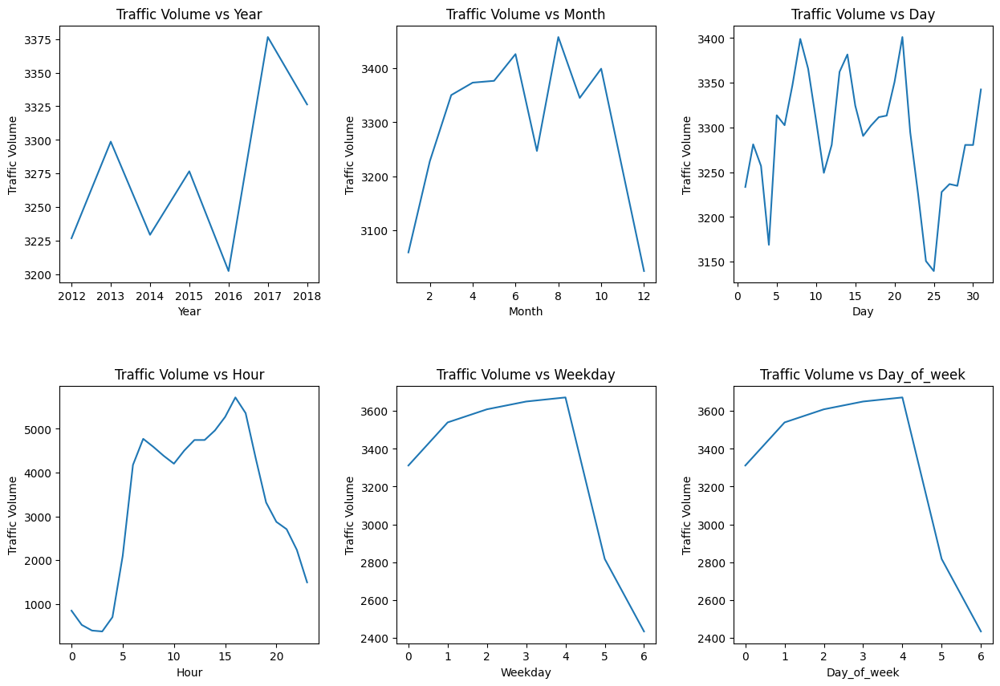

In [16]:
import matplotlib.pyplot as plt

features = ['year', 'month', 'day', 'hour', 'weekday', 'day_of_week']
fig, axes = plt.subplots(nrows=2, ncols=3, figsize=(15, 10))
axes = axes.flatten()

for i, feature in enumerate(features):
    axes[i].plot(tv_df.groupby(feature)['traffic_volume'].mean())
    axes[i].set_title(f"Traffic Volume vs {feature.capitalize()}")
    axes[i].set_xlabel(feature.capitalize())
    axes[i].set_ylabel("Traffic Volume")
    
plt.subplots_adjust(hspace=0.4, wspace=0.3)
plt.show()


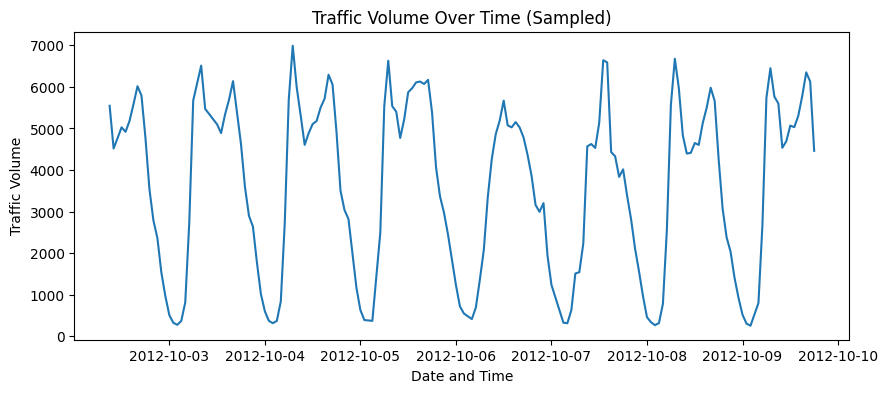

In [17]:
sampled_tv_df = tv_df[:7*24]
plt.figure(figsize=(10, 4))
plt.plot(pd.to_datetime(sampled_tv_df['date_time']), sampled_tv_df['traffic_volume'])
plt.xlabel("Date and Time")
plt.ylabel("Traffic Volume")
plt.title("Traffic Volume Over Time (Sampled)")
plt.show()

Encoding Cyclical Dependencies for ("hour", "day_of_week", months in a year) as new features using Sin and Cosine Transformations. These transformations encode the cyclical nature of the attribute by mapping the values onto a circle. Sin and Cos allows us to capture the periodic nature of time-related variables, such as hours, days, and months.

In [18]:
# Calculate the sin and cos values of the 'hour' column to create cyclical features for time of day
tv_df['hour_sin'] = np.sin(2 * np.pi * tv_df['hour'] / 24)
tv_df['hour_cos'] = np.cos(2 * np.pi * tv_df['hour'] / 24)

# Calculate the sin and cos values of the 'day_of_week' column to create cyclical features for days of the week
tv_df['day_sin'] = np.sin(2 * np.pi * tv_df['day_of_week'] / 7)
tv_df['day_cos'] = np.cos(2 * np.pi * tv_df['day_of_week'] / 7)

# Calculate the sin and cos values of the 'month' column to create cyclical features for months of the year
tv_df['month_sin'] = np.sin(2 * np.pi * tv_df['month'] / 12)
tv_df['month_cos'] = np.cos(2 * np.pi * tv_df['month'] / 12)

Visualise the transformed spaces

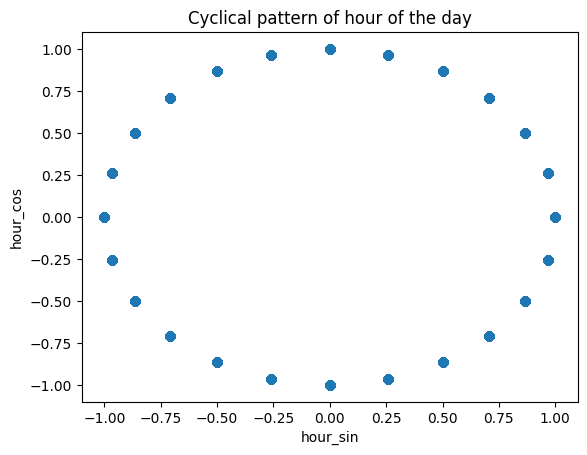

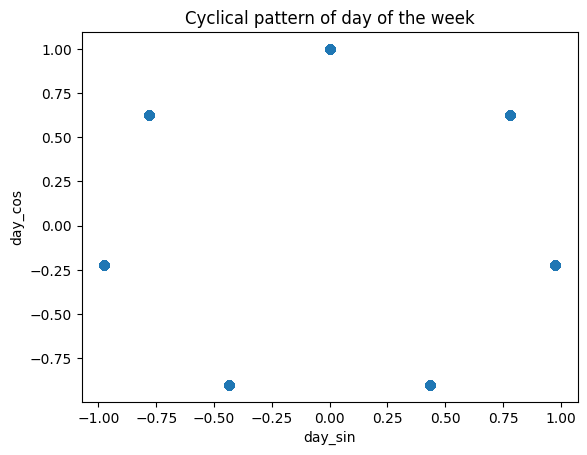

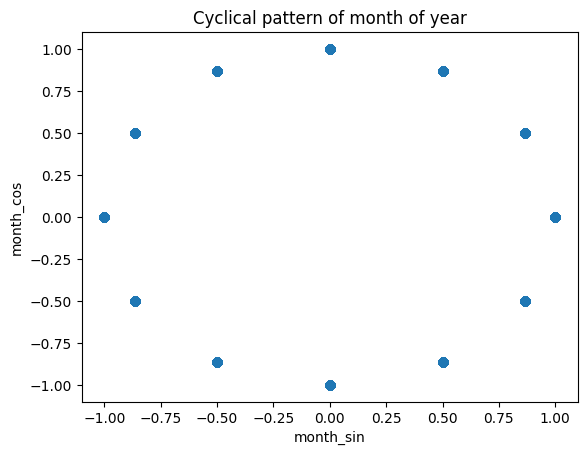

In [19]:
plt.scatter(tv_df['hour_sin'], tv_df['hour_cos'])
plt.title('Cyclical pattern of hour of the day')
plt.xlabel('hour_sin')
plt.ylabel('hour_cos')
plt.show()
print()
plt.scatter(tv_df['day_sin'], tv_df['day_cos'])
plt.title('Cyclical pattern of day of the week')
plt.xlabel('day_sin')
plt.ylabel('day_cos')
plt.show()
print()
plt.scatter(tv_df['month_sin'], tv_df['month_cos'])
plt.title('Cyclical pattern of month of year')
plt.xlabel('month_sin')
plt.ylabel('month_cos')
plt.show()
print()


Creating Features by using Rolling Mean Statistic to smooth out short-term fluctuations or noise and highlight underlying trends or patterns in the traffic date. 

In [20]:
# Compute rolling means for 'temp', 'clouds_all', 'rain_1h', and 'snow_1h' with window sizes of 3 and 6, and store the results as new columns in the DataFrame
for col in ['temp','clouds_all','rain_1h','snow_1h']:
  for window in [3, 6]:
    tv_df[col + "_win_" + str(window)] = tv_df[col].rolling(window=window).mean().astype(np.float16)

Creating features with mean target encoding

In [21]:
# Compute the mean 'traffic_volume' for each unique value of 'temp', 'rain_1h', and 'clouds_all', and store the results as new columns in the DataFrame
tv_df["temp_avg"] = tv_df.groupby("temp")["traffic_volume"].transform("mean").astype(np.float16)
tv_df["rain_avg"] = tv_df.groupby("rain_1h")["traffic_volume"].transform("mean").astype(np.float16)
tv_df["cloud_avg"] = tv_df.groupby("clouds_all")["traffic_volume"].transform("mean").astype(np.float16)

In [22]:
tv_df.dropna(axis=0, inplace=True)
tv_df.reset_index(drop=True, inplace=True)

# Data Visualisation and Feature Selection

In [23]:
# Function to plot the distribution, evolution, and distribution of traffic volume for a given column
def plot_distribution(data, column):

    # Create a figure with three subplots and set its size and title
    fig = plt.figure(figsize=(30, 13))
    fig.suptitle(f"Data visualization for {column} feature")

    # First subplot: plot the count of observations for each unique value in the column
    plt.subplot(1, 3, 1)
    sns.countplot(x=column, data=data)
    plt.title(f"Distribution of observations by {column}")
    plt.xlabel(f"{column.capitalize()}")
    plt.ylabel("Count")
    plt.xticks(rotation=0)

    # Second subplot: plot the box plot of traffic volume for each unique value in the column (without outliers)
    plt.subplot(1, 3, 2)
    sns.boxplot(data=data, x=column, y="traffic_volume", width=0.4, linewidth=2, showfliers=False)
    plt.title(f"Evolution of traffic volume by {column}")
    plt.xlabel(f"{column.capitalize()}")
    plt.ylabel("Traffic volume")
    plt.xticks(rotation=0)

    # Third subplot: plot the strip plot of traffic volume for each unique value in the column
    plt.subplot(1, 3, 3)
    sns.stripplot(data=data, x=column, y="traffic_volume", color="green", linewidth=1, alpha=0.4)
    plt.title(f"Distribution of traffic volume observations by {column}")
    plt.xlabel(f"{column.capitalize()}")
    plt.ylabel("Traffic volume")
    plt.xticks(rotation=0)

    plt.subplots_adjust(hspace=0.3)
    plt.show()


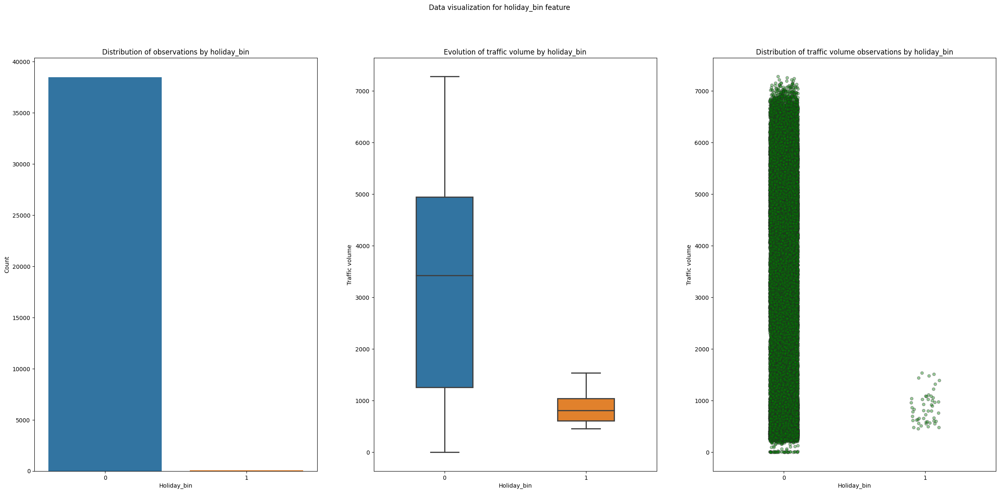

In [24]:
plot_distribution(tv_df, 'holiday_bin')

Since the number of holidays << number of days in the dataset, the holiday variable is binarized.

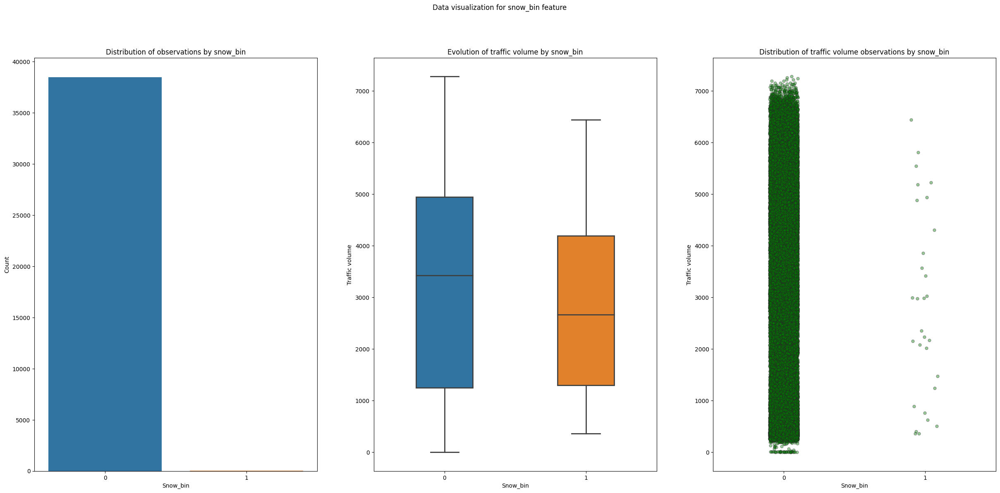

In [25]:
plot_distribution(tv_df, 'snow_bin')

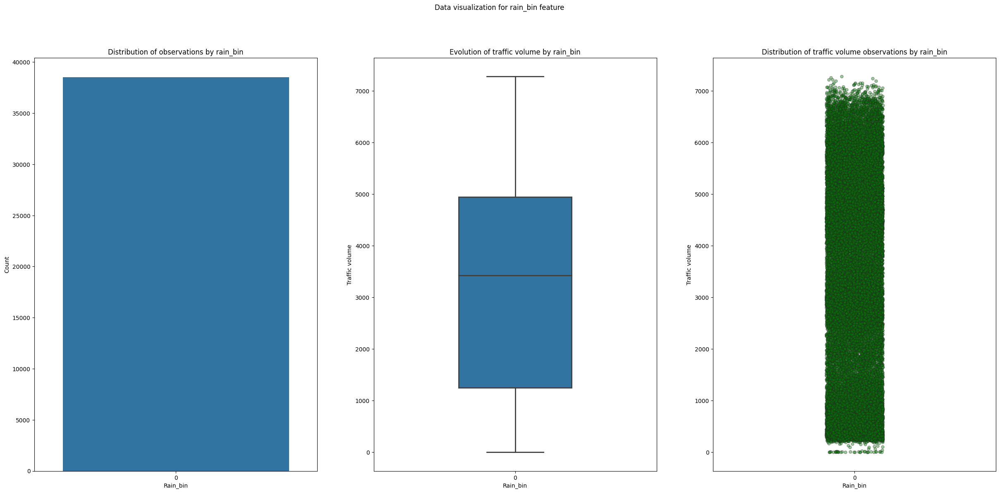

In [26]:
plot_distribution(tv_df, 'rain_bin')

rain_bin is not representative of the traffic_volume. rain-bin will be removed during data cleaning

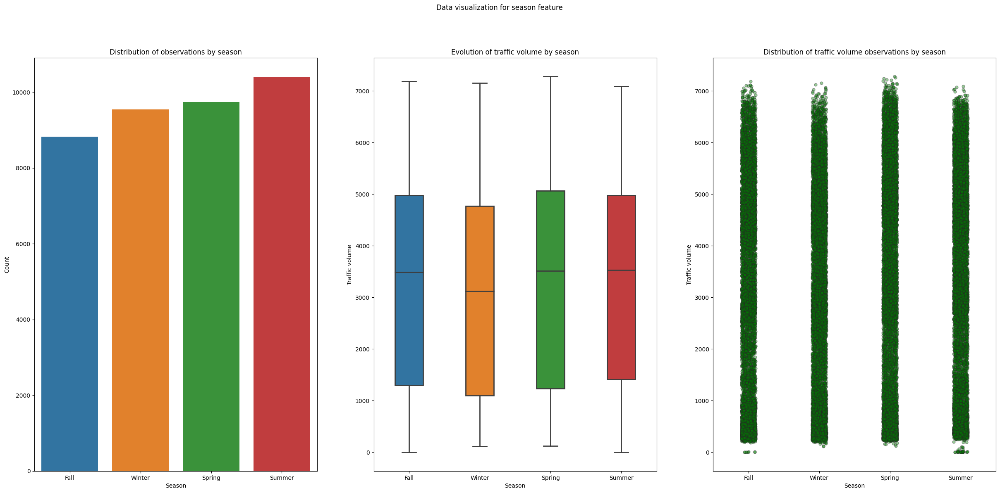

In [27]:
plot_distribution(tv_df, 'season')

Traffic volume is more during the summers and is the least during Fall and Winter

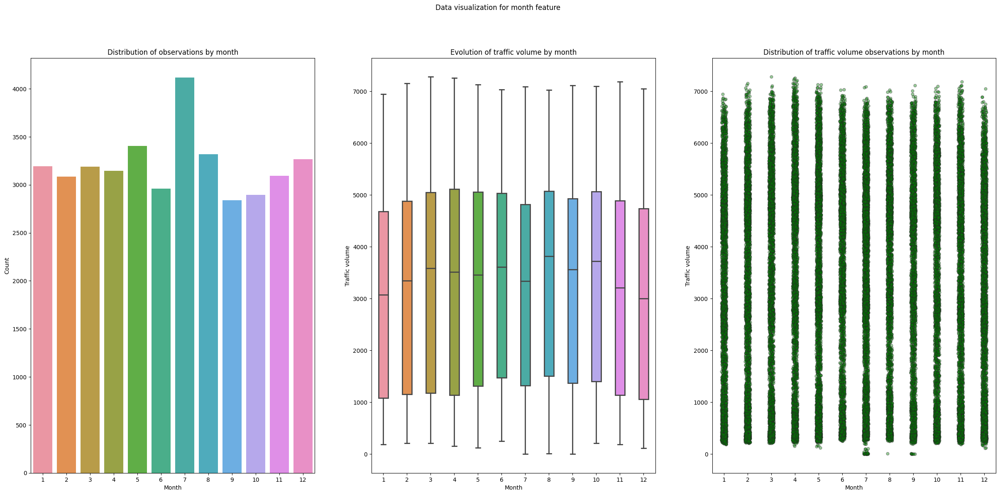

In [28]:
plot_distribution(tv_df, 'month')

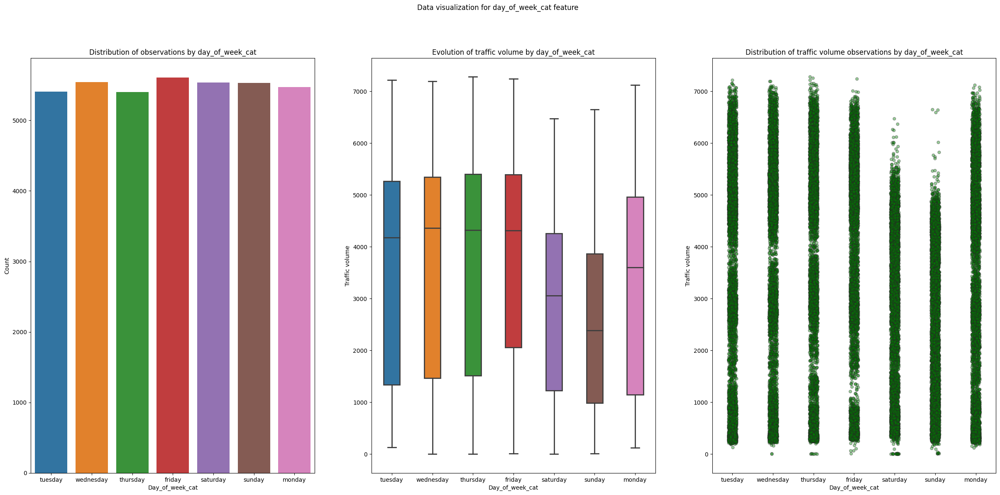

In [29]:
plot_distribution(tv_df, 'day_of_week_cat')

On average, the total daily and peak traffic on a weekend is lower than the weekday.

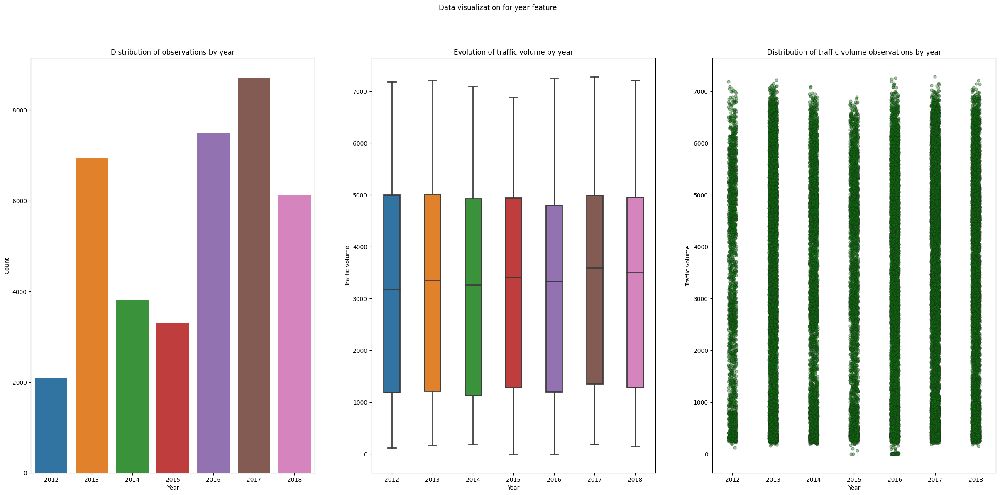

In [30]:
plot_distribution(tv_df, 'year')

There is less data available for the year 2012 and the dips that occured in 2014, 2015, and 2018 can also be seen in the traffic_volume vs year plot.

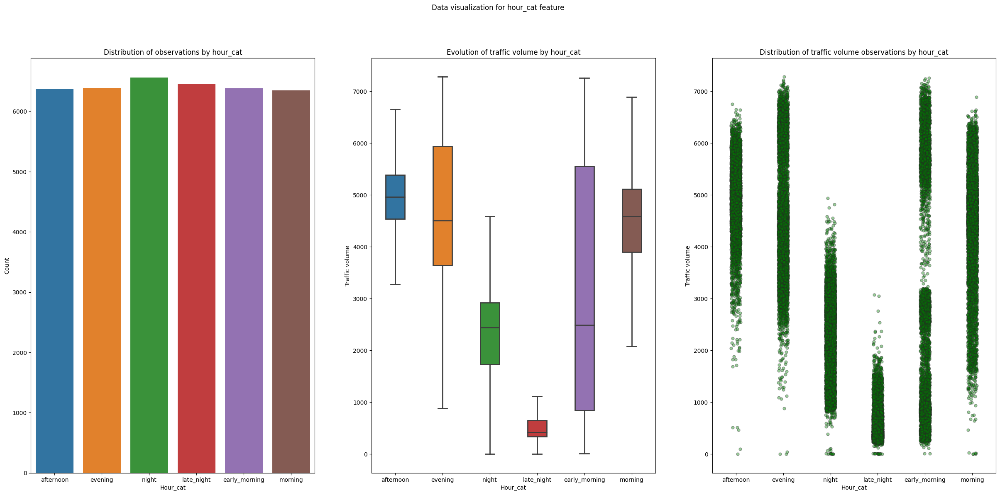

In [31]:
plot_distribution(tv_df, 'hour_cat')

Most of the traffic is in the morning and the evenings and the traffic volume is the least at late nights.


**Dataframe Encoding - Label (Conventional ML Models), One-Hot (Neural Networks)**

In [32]:
tv_df.columns

Index(['holiday', 'temp', 'rain_1h', 'snow_1h', 'clouds_all', 'weather_main',
       'weather_description', 'date_time', 'traffic_volume', 'year', 'month',
       'day', 'hour', 'weekday', 'day_of_week', 'date', 'holiday_bin',
       'rain_bin', 'snow_bin', 'season', 'day_of_week_cat', 'hour_cat',
       'snow_1h_lag_1', 'snow_1h_lag_2', 'snow_1h_lag_3', 'snow_1h_lag_4',
       'snow_1h_lag_5', 'snow_1h_lag_6', 'rain_1h_lag_1', 'rain_1h_lag_2',
       'rain_1h_lag_3', 'rain_1h_lag_4', 'rain_1h_lag_5', 'rain_1h_lag_6',
       'temp_lag_1', 'temp_lag_2', 'temp_lag_3', 'temp_lag_4', 'temp_lag_5',
       'temp_lag_6', 'clouds_all_lag_1', 'clouds_all_lag_2',
       'clouds_all_lag_3', 'clouds_all_lag_4', 'clouds_all_lag_5',
       'clouds_all_lag_6', 'traffic_volume_lag_1', 'traffic_volume_lag_2',
       'traffic_volume_lag_3', 'traffic_volume_lag_4', 'traffic_volume_lag_5',
       'traffic_volume_lag_6', 'hour_sin', 'hour_cos', 'day_sin', 'day_cos',
       'month_sin', 'month_cos', 'temp_w

In [33]:
tv_df.head()

,holiday,temp,rain_1h,snow_1h,clouds_all,weather_main,weather_description,date_time,traffic_volume,year,...,temp_win_6,clouds_all_win_3,clouds_all_win_6,rain_1h_win_3,rain_1h_win_6,snow_1h_win_3,snow_1h_win_6,temp_avg,rain_avg,cloud_avg
0,None,293.17,0.0,0.0,1,Clear,sky is clear,2012-10-02 15:00:00,5584,2012,...,290.75,25.671875,55.343750,0.0,0.0,0.0,0.0,3724.0,3290.0,2824.0
1,None,293.86,0.0,0.0,1,Clear,sky is clear,2012-10-02 16:00:00,6015,2012,...,291.50,1.000000,43.000000,0.0,0.0,0.0,0.0,3440.0,3290.0,2824.0
2,None,294.14,0.0,0.0,20,Clouds,few clouds,2012-10-02 17:00:00,5791,2012,...,292.25,7.332031,31.328125,0.0,0.0,0.0,0.0,2766.0,3290.0,3720.0
3,None,293.10,0.0,0.0,20,Clouds,few clouds,2012-10-02 18:00:00,4770,2012,...,292.75,13.664062,19.671875,0.0,0.0,0.0,0.0,2704.0,3290.0,3720.0
4,None,290.97,0.0,0.0,20,Clouds,few clouds,2012-10-02 19:00:00,3539,2012,...,292.75,20.000000,10.500000,0.0,0.0,0.0,0.0,3886.0,3290.0,3720.0


In [34]:
tv_df.set_index("date_time", inplace=True)

Label Encoding

In [35]:
X_label, y = tv_df.drop('traffic_volume', axis = 1).copy(), tv_df['traffic_volume'].copy()
X_onehot = tv_df.drop('traffic_volume', axis = 1).copy()

# Label Encoding of every categorical attribute and store in X_label
label_encode = LabelEncoder()
for col in X_label.columns:
  if X_label[col].dtype == 'object':
    X_label[col] = label_encode.fit_transform(X_label[col])

print("Label Encoded Dataframe")
X_label.head()


Label Encoded Dataframe


,holiday,temp,rain_1h,snow_1h,clouds_all,weather_main,weather_description,year,month,day,...,temp_win_6,clouds_all_win_3,clouds_all_win_6,rain_1h_win_3,rain_1h_win_6,snow_1h_win_3,snow_1h_win_6,temp_avg,rain_avg,cloud_avg
date_time,,,,,,,,,,,,,,,,,,,,,
2012-10-02 15:00:00,7,293.17,0.0,0.0,1,0,25,2012,10,2,...,290.75,25.671875,55.343750,0.0,0.0,0.0,0.0,3724.0,3290.0,2824.0
2012-10-02 16:00:00,7,293.86,0.0,0.0,1,0,25,2012,10,2,...,291.50,1.000000,43.000000,0.0,0.0,0.0,0.0,3440.0,3290.0,2824.0
2012-10-02 17:00:00,7,294.14,0.0,0.0,20,1,4,2012,10,2,...,292.25,7.332031,31.328125,0.0,0.0,0.0,0.0,2766.0,3290.0,3720.0
2012-10-02 18:00:00,7,293.10,0.0,0.0,20,1,4,2012,10,2,...,292.75,13.664062,19.671875,0.0,0.0,0.0,0.0,2704.0,3290.0,3720.0
2012-10-02 19:00:00,7,290.97,0.0,0.0,20,1,4,2012,10,2,...,292.75,20.000000,10.500000,0.0,0.0,0.0,0.0,3886.0,3290.0,3720.0


Using Lasso Regression to get insight into variables to select.

In [36]:
# Import necessary libraries for Lasso regression, scaling, and evaluation
from sklearn.linear_model import Lasso
from sklearn.linear_model import LassoCV
from sklearn.preprocessing import StandardScaler
from sklearn.model_selection import train_test_split
from sklearn.metrics import mean_squared_error

# Standardize the features using StandardScaler
scaler = StandardScaler()
X_scaled = scaler.fit_transform(X_label)

# Split the data into training and testing sets with a 70:30 ratio
X_train, X_test, y_train, y_test = train_test_split(X_scaled, y, test_size=0.3, random_state=42)

# Perform Lasso regression with cross-validation to find the best alpha
lasso_cv = LassoCV(cv=10, random_state=42)
lasso_cv.fit(X_train, y_train.values.ravel())
print("Best alpha:", lasso_cv.alpha_)

# Fit the Lasso model using the best alpha found
lasso = Lasso(alpha=lasso_cv.alpha_)
lasso.fit(X_train, y_train.values.ravel())

# Make predictions on the test set and calculate the root mean squared error
y_pred = lasso.predict(X_test)
print("RMSE:", np.sqrt(mean_squared_error(y_test, y_pred)))
print()

feature_coef = pd.DataFrame({"Feature": X_label.columns, "Coefficient": lasso.coef_})
print(feature_coef)
print()

# Select the features with non-zero coefficients
selected_features = feature_coef[feature_coef["Coefficient"] != 0]["Feature"].values
selected_features


Best alpha: 1.751599217304268
RMSE: 616.3723387798557

          Feature  Coefficient
0         holiday    -2.642746
1            temp  -151.634873
2         rain_1h     0.000000
3         snow_1h    -0.000000
4      clouds_all    -0.358155
..            ...          ...
62  snow_1h_win_3    -0.000000
63  snow_1h_win_6    -0.000000
64       temp_avg    97.825804
65       rain_avg     0.000000
66      cloud_avg     5.886712

[67 rows x 2 columns]



array(['holiday', 'temp', 'clouds_all', 'weather_main',
       'weather_description', 'month', 'day', 'hour', 'weekday',
       'day_of_week', 'holiday_bin', 'snow_bin', 'season',
       'day_of_week_cat', 'hour_cat', 'snow_1h_lag_1', 'snow_1h_lag_3',
       'snow_1h_lag_5', 'snow_1h_lag_6', 'temp_lag_2', 'temp_lag_4',
       'temp_lag_5', 'clouds_all_lag_5', 'clouds_all_lag_6',
       'traffic_volume_lag_1', 'traffic_volume_lag_2',
       'traffic_volume_lag_3', 'traffic_volume_lag_4',
       'traffic_volume_lag_6', 'hour_sin', 'hour_cos', 'day_sin',
       'day_cos', 'month_sin', 'temp_avg', 'cloud_avg'], dtype=object)

Based on EDA and Feature Selection, these attributes could be a good representation for the data: ['temp', 'clouds_all', 'date', 'year', 'hour', 'weekday', 'day_of_week_cat', 'hour_cat', 'rain_1h', 'snow_1h'] + binarized_attributes + lag_attributes + rolling_mean attributes + mean_average_attributes + cyclic_attributes and are a good combination of attributes to train and test our models.

In [37]:
lag_attributes = ['snow_1h_lag_1', 'snow_1h_lag_2', 'snow_1h_lag_3', 'snow_1h_lag_4',
       'snow_1h_lag_5', 'snow_1h_lag_6', 'rain_1h_lag_1', 'rain_1h_lag_2',
       'rain_1h_lag_3', 'rain_1h_lag_4', 'rain_1h_lag_5', 'rain_1h_lag_6',
       'temp_lag_1', 'temp_lag_2', 'temp_lag_3', 'temp_lag_4', 'temp_lag_5',
       'temp_lag_6', 'clouds_all_lag_1', 'clouds_all_lag_2',
       'clouds_all_lag_3', 'clouds_all_lag_4', 'clouds_all_lag_5',
       'clouds_all_lag_6', 'traffic_volume_lag_1', 'traffic_volume_lag_2',
       'traffic_volume_lag_3', 'traffic_volume_lag_4', 'traffic_volume_lag_5',
       'traffic_volume_lag_6']

avg_attributes = ['temp_avg', 'rain_avg', 'cloud_avg']

win_attributes = ['clouds_all_win_3', 'clouds_all_win_6', 'rain_1h_win_3',
       'rain_1h_win_6', 'snow_1h_win_3', 'snow_1h_win_6', 'temp_win_6', 'temp_win_3']

cyclical_attributes = ['hour_sin', 'hour_cos', 'day_sin', 'day_cos',
       'month_sin', 'month_cos']

original_relevant_features = ['temp', 'rain_1h', 'clouds_all', 'traffic_volume', 'year',
       'hour', 'date', 'holiday_bin',
       'rain_bin', 'day_of_week_cat', 'hour_cat', 'snow_bin', 'snow_1h' 
        ]

features_to_select = lag_attributes + avg_attributes + win_attributes + cyclical_attributes + original_relevant_features
        
tv_df = tv_df[features_to_select]

Defining Performance Metrics

In [38]:
from sklearn.metrics import mean_absolute_error, mean_squared_error, r2_score, mean_absolute_percentage_error
import numpy as np

# Function to calculate performance metrics (MAE, RMSE, R2, and MAPE) for model evaluation
def calc_performance(y_actual, y_pred):
    mae = mean_absolute_error(y_actual, y_pred)
    rmse = np.sqrt(mean_squared_error(y_actual, y_pred))
    r2 = r2_score(y_actual, y_pred)
    mape_score = mean_absolute_percentage_error(y_actual, y_pred)
    
    return {"MAE": mae, "RMSE": rmse, "MAPE": mape_score, "R2": round(r2,4)}

# Machine Learning Models

In [39]:
# Min-Max Scaling and Splitting the Label and One-Hot Encoded Dataframes
from sklearn.preprocessing import MinMaxScaler
from sklearn.model_selection import train_test_split, KFold
from sklearn.metrics import mean_absolute_error, mean_squared_error, r2_score

min_max_scaler = MinMaxScaler(feature_range=(0,1))

# Scaling the features to have values in the range of (0,1)
scaled_X_labels = pd.DataFrame(min_max_scaler.fit_transform(X_label), columns = X_label.columns)
scaled_y = pd.DataFrame(min_max_scaler.fit_transform(y.values.reshape(-1, 1)).ravel())

# Split the data into training and testing sets with a 70:30 ratio, without shuffling, using a random state of 42 for reproducibility
XL_train, XL_test, yL_train, yL_test = train_test_split(scaled_X_labels, scaled_y , test_size=0.3, random_state = 42, shuffle = False)

Code for visualizing actual and predicted values for traffic volume

In [40]:
import pandas as pd
import matplotlib.pyplot as plt

# Function to plot the original and predicted traffic volume data
def plot_traffic_volume(y_test, y_pred):

    # Convert the input data to a one-dimensional arrays
    y_test = y_test.squeeze()
    y_pred = y_pred.squeeze()

    # Create a DataFrame containing the original and predicted traffic volume data
    results = pd.DataFrame({"y_test": y_test,
                            "y_pred": y_pred},
                            index=y_test.index)

    # Sort the DataFrame by index (date_time attribute)
    results = results.sort_index()

    # Plot the traffic volume for the entire test set
    plt.figure(figsize=(15, 7))
    plt.plot(results.index, results['y_test'], label='Original Data')
    plt.plot(results.index, results['y_pred'], label='Predicted Data', linestyle='--', color='r')
    plt.xlabel('Date and Time')
    plt.ylabel('Traffic Volume')
    plt.title('Traffic Volume: Original Data vs. Predicted Data')
    plt.legend()
    plt.show()

    # Select the first 7 days of data from the test set
    first_7_days = results.loc[results.index[:7*24]]

    # Plot the traffic volume for the first 7 days of the test set
    plt.figure(figsize=(15, 7))
    plt.plot(first_7_days.index, first_7_days['y_test'], label='Original Data')
    plt.plot(first_7_days.index, first_7_days['y_pred'], label='Predicted Data', linestyle='--', color='r')
    plt.xlabel('Date and Time')
    plt.ylabel('Traffic Volume')
    plt.title('Traffic Volume: Original Data vs. Predicted Data (First 7 Days)')
    plt.legend()
    plt.show()


# Linear Regression

In [41]:
from sklearn.linear_model import LinearRegression
from sklearn.metrics import mean_squared_error, r2_score

# Instantiate and train a Linear Regression model using the training data
lr_model = LinearRegression()
lr_model.fit(XL_train, yL_train)

# Make predictions on the test set using the trained model
y_pred = lr_model.predict(XL_test)

# Calculate and print the performance metrics (MAE, RMSE, R2, and MAPE) for the model's predictions
print(calc_performance(yL_test, y_pred))

{'MAE': 0.05629954463505612, 'RMSE': 0.07362228209863221, 'MAPE': 0.2661518159077257, 'R2': 0.9262}


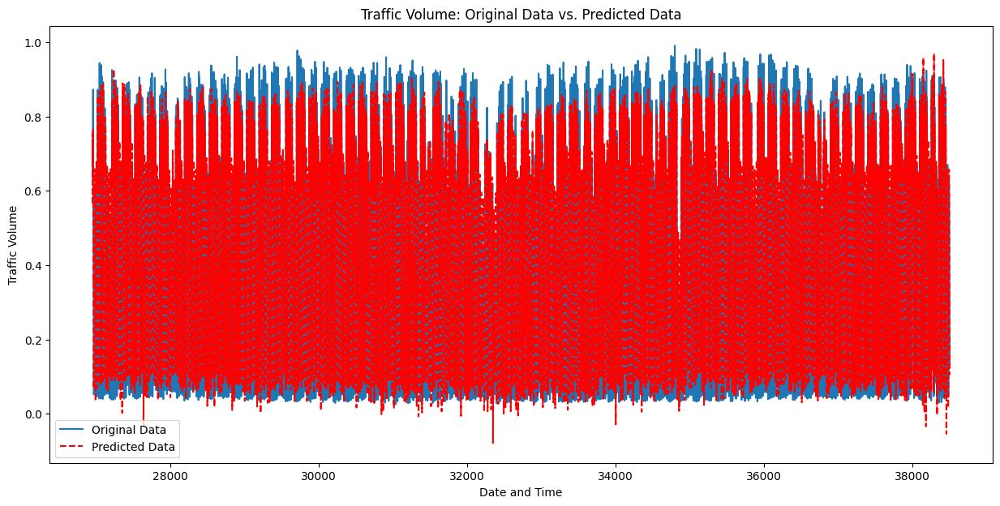

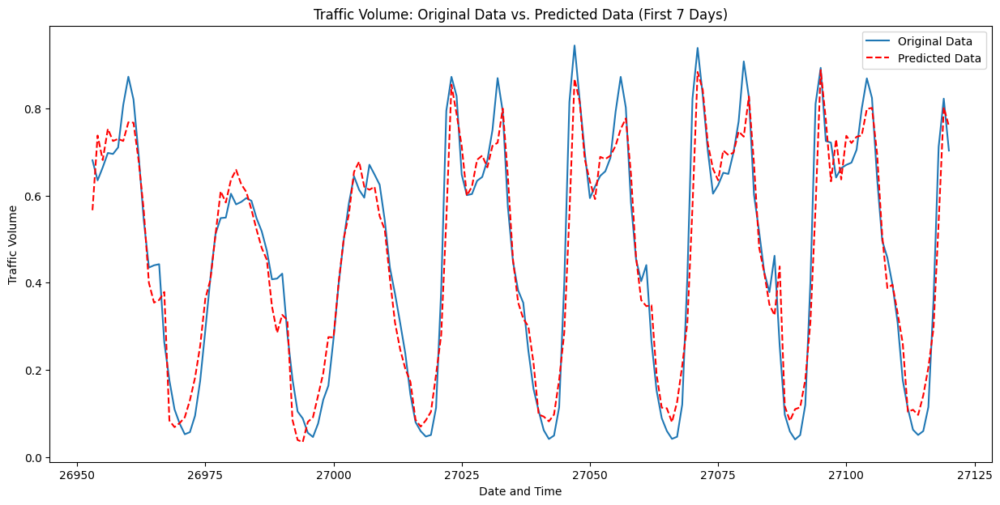

In [42]:
plot_traffic_volume(yL_test, y_pred)

# Support Vector Machine

In [43]:
from sklearn.svm import SVR

svr_model = SVR(kernel='rbf', C=1, epsilon=0.1, gamma='scale')

svr_model.fit(XL_train, yL_train.values.ravel())

yL_pred = svr_model.predict(XL_test)

# Calculate and print the performance metrics (MAE, RMSE, R2, and MAPE) for the model's predictions
print(calc_performance(yL_test, yL_pred))

{'MAE': 0.05580395155525971, 'RMSE': 0.07199647431894644, 'MAPE': 0.2303398105339938, 'R2': 0.9294}


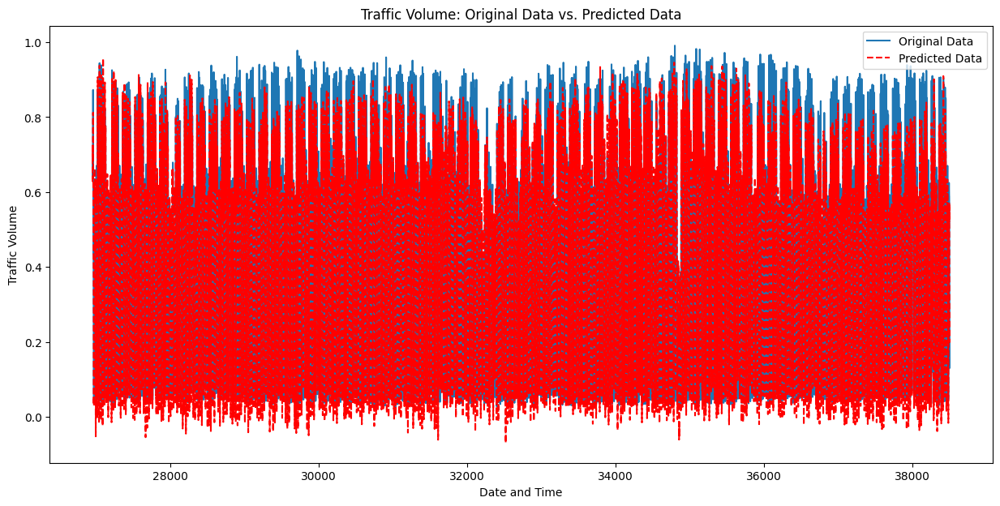

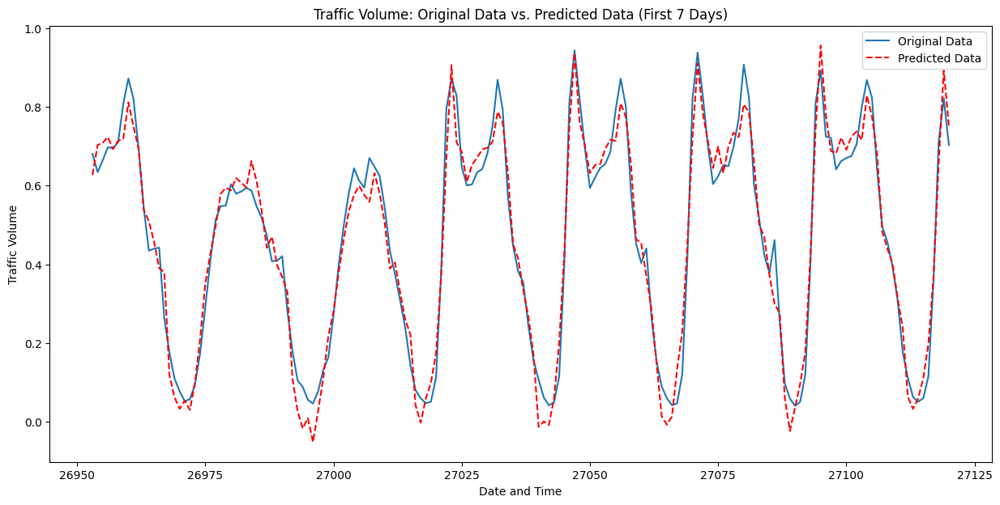

In [44]:
plot_traffic_volume(yL_test, yL_pred)

# Random Forest Regression

In [86]:
# Random Forest Regression
from sklearn.ensemble import RandomForestRegressor

# Hold-out Validation
reg = RandomForestRegressor()
reg = reg.fit(XL_train, yL_train)
predict = reg.predict(XL_test)
print(calc_performance(yL_test, predict))

# Cross-Validation
X_label_np = X_label.to_numpy()
y_np = y.to_numpy()

# Create a KFold cross-validator with 10 splits
kf = KFold(n_splits=10, shuffle=True, random_state=42)

rmse = []
r2 = []
mae = []
mape_scores = []

# Perform cross-validation
for train_index, test_index in kf.split(X_label_np):

    # Create a RandomForestRegressor model for the current fold
    reg_kf = RandomForestRegressor()
    reg_kf.fit(X_label_np[train_index], y_np[train_index])
    y_pred = reg_kf.predict(X_label_np[test_index])
    actuals = y_np[test_index]

    # Calculate and store performance metrics for the current fold
    rmse.append(np.sqrt(mean_squared_error(actuals, y_pred)))
    r2.append(r2_score(actuals, y_pred))
    mae.append(mean_absolute_error(actuals, y_pred))
    mape_scores.append(mean_absolute_error(actuals, y_pred))

# Calculate and print the average performance metrics
avg_r2 = np.mean(r2)
avg_rmse = np.mean(rmse)
avg_mae = np.mean(mae)
print("AVG R2 Score : ", avg_r2)
print("Average RMSE: ", avg_rmse)
print("Average MAE:", avg_mae)
print("Average MAPE:", np.mean(mape_scores))


<ipython-input-86-6ea0e333c3be>:6: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  reg = reg.fit(XL_train, yL_train)


{'MAE': 0.02341216092166144, 'RMSE': 0.037747726772560206, 'MAPE': 0.07636713443126655, 'R2': 0.9806}
AVG R2 Score :  0.9811264296292295
Average RMSE:  272.3386829261619
Average MAE: 159.47224283839245
Average MAPE: 159.47224283839245


# XGBoost

In [84]:
# using XGBoost
from xgboost import XGBRegressor

# Create an XGBoost regression model with specified parameters
xgb_model = XGBRegressor(objective="reg:squarederror", n_estimators=1000, random_state=42, n_jobs=-1, early_stopping_rounds=10)
xgb_model.fit(XL_train, yL_train, eval_set=[(XL_test, yL_test)], verbose=0)
y_pred = xgb_model.predict(XL_test)
print(calc_performance(yL_test, y_pred))

rmse = []
r2 = []
mae = []
mape_scores = []

# Perform cross-validation using the KFold cross-validator
for train_index, test_index in kf.split(X_label):

    # Create an XGBoost regression model for the current fold
    xgb_model = XGBRegressor(objective="reg:squarederror", n_estimators=1000, random_state=42, n_jobs=-1, early_stopping_rounds=10)
    xgb_model.fit(X_label.iloc[train_index], y.iloc[train_index], eval_set=[(X_label.iloc[test_index], y.iloc[test_index])], verbose=0)
    predictions = xgb_model.predict(X_label.iloc[test_index])
    actuals = y.iloc[test_index]

    # Calculate and store performance metrics for the current fold
    rmse.append(np.sqrt(mean_squared_error(actuals, predictions)))
    r2.append(r2_score(actuals, predictions))
    mae.append(mean_absolute_error(actuals, predictions))
    mape_scores.append(mean_absolute_percentage_error(actuals, predictions))

# Calculate and print the average performance metrics
avg_r2 = np.mean(r2)
avg_rmse = np.mean(rmse)
avg_mae = np.mean(mae)
print("AVG R2 Score : ", avg_r2)
print("Average RMSE: ", avg_rmse)
print("Average MAE:", avg_mae)
print("Average MAPE:", np.mean(mape_scores))


{'MAE': 0.022786450643077126, 'RMSE': 0.03627841966927327, 'MAPE': 0.0748651854107348, 'R2': 0.9821}
AVG R2 Score :  0.9799051977765132
Average RMSE:  281.01362644024147
Average MAE: 170.14153491697294
Average MAPE: 184130947092187.7


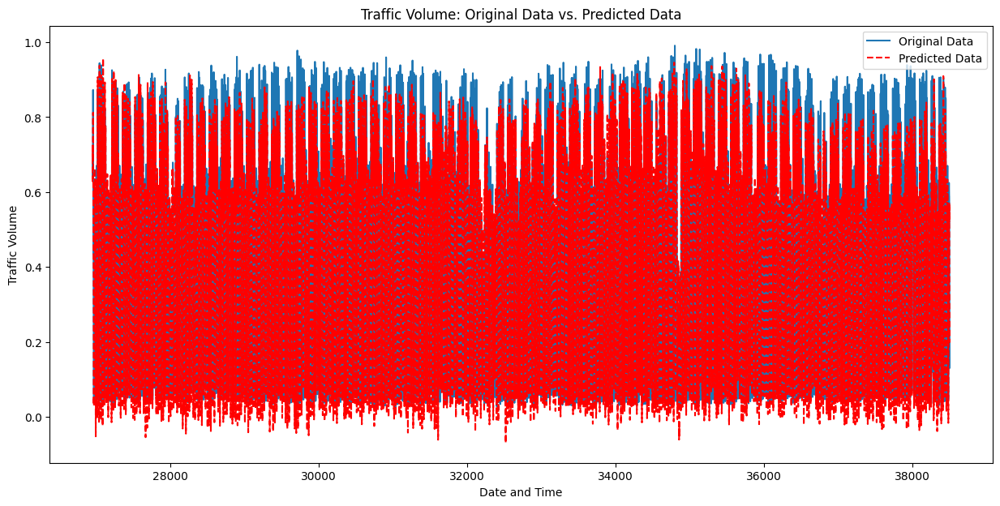

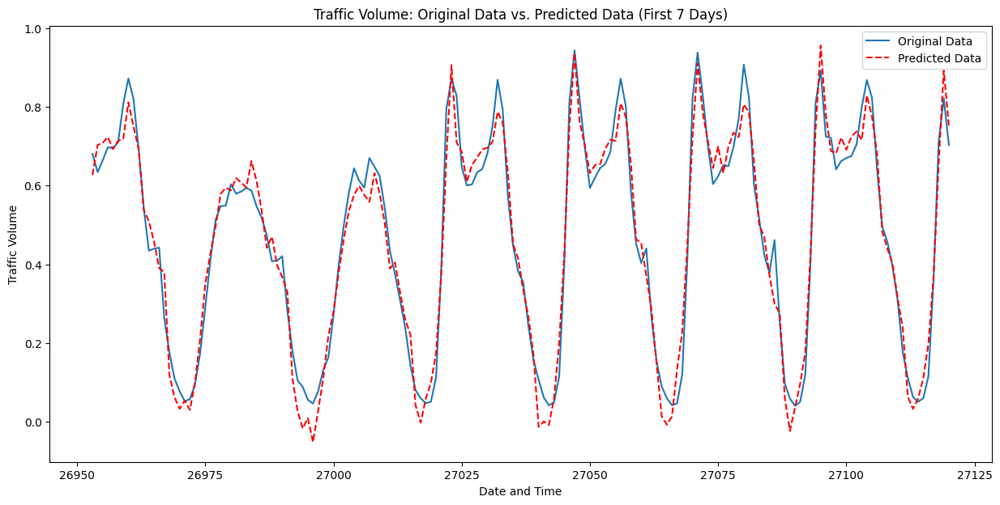

In [85]:
plot_traffic_volume(yL_test, yL_pred)

# Neural Networks

One-Hot Encoding

In [47]:
tv_df.drop('date', inplace = True, axis = 1)

In [48]:
tv_df_copy = tv_df.copy()
cat_cols = ['day_of_week_cat','hour_cat']
X_onehot = pd.get_dummies(tv_df_copy, columns = cat_cols)
X_onehot = pd.concat([tv_df_copy.drop(cat_cols, axis=1), X_onehot], axis=1)

print("One-Hot Encoded Dataframe")
X_onehot.head()

One-Hot Encoded Dataframe


,snow_1h_lag_1,snow_1h_lag_2,snow_1h_lag_3,snow_1h_lag_4,snow_1h_lag_5,snow_1h_lag_6,rain_1h_lag_1,rain_1h_lag_2,rain_1h_lag_3,rain_1h_lag_4,...,day_of_week_cat_sunday,day_of_week_cat_thursday,day_of_week_cat_tuesday,day_of_week_cat_wednesday,hour_cat_afternoon,hour_cat_early_morning,hour_cat_evening,hour_cat_late_night,hour_cat_morning,hour_cat_night
date_time,,,,,,,,,,,,,,,,,,,,,
2012-10-02 15:00:00,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,...,0,0,1,0,1,0,0,0,0,0
2012-10-02 16:00:00,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,...,0,0,1,0,0,0,1,0,0,0
2012-10-02 17:00:00,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,...,0,0,1,0,0,0,1,0,0,0
2012-10-02 18:00:00,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,...,0,0,1,0,0,0,1,0,0,0
2012-10-02 19:00:00,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,...,0,0,1,0,0,0,1,0,0,0


Train-Validation-Test Split for Neural Networks

In [56]:
!pip3 install netron
import netron

In [50]:
X_train, X_temp, y_train, y_temp = train_test_split(X_onehot, y, test_size=0.3, random_state=42, shuffle = False)
X_val, X_test, y_val, y_test = train_test_split(X_temp, y_temp, test_size=2/3, random_state=42, shuffle = False)

# Setting date_time as the index of each dataset

X_train = pd.DataFrame(X_train, index = X_train.index)
X_test = pd.DataFrame(X_test, index = X_test.index)
X_val = pd.DataFrame(X_val, index = X_val.index)

y_train = pd.DataFrame(y_train, index = y_train.index)
y_test = pd.DataFrame(y_test, index = y_test.index)
y_val = pd.DataFrame(y_val, index = y_val.index)

# Reshaping the data for the input to Neural Networks
X_train_reshaped = X_train.values.reshape((X_train.shape[0], 1, X_train.shape[1]))
X_val_reshaped = X_val.values.reshape((X_val.shape[0], 1, X_val.shape[1]))
X_test_reshaped = X_test.values.reshape((X_test.shape[0], 1, X_test.shape[1]))

# Plots Validation Loss and Training Loss curves against each Epoch
def plot_loss(history, title):
    plt.plot(history.history['loss'], label='Training Loss')
    plt.plot(history.history['val_loss'], label='Validation Loss')
    plt.xlabel('Epoch')
    plt.ylabel('Loss')
    plt.legend()
    plt.title(title)
    plt.show()


In [51]:
print(X_onehot.shape)
print(X_train.shape)
print(X_val.shape)
print(X_test.shape)

(38505, 127)
(26953, 127)
(3850, 127)
(7702, 127)


Defining Callback functions to be called after every epoch 

In [52]:
from keras.callbacks import EarlyStopping, ReduceLROnPlateau

# If the validation loss does not improve over 3 Epochs, the code stops the training.
early_stopping = EarlyStopping(
    monitor="val_loss",
    patience=3,
    min_delta=0.01,
    mode="min",
    verbose=1
)

# This is done to prevent jumping around the minima during Gradient Descent
reduce_lr = ReduceLROnPlateau(
    monitor="val_loss",
    patience=3,
    min_delta= 0.01,
    factor=0.01,
    cooldown=2,
    verbose=1
)


# LSTM

In [80]:
import numpy as np
import tensorflow as tf
from keras.models import Sequential
from keras.layers import Dense, LSTM, Dropout
from sklearn.metrics import mean_absolute_error, mean_squared_error, r2_score
from keras.optimizers import Adam
import matplotlib.pyplot as plt

# Create an LSTM-based sequential model
model = Sequential([
    # Add an LSTM layer with 128 units, ReLU activation, and return sequences enabled
    LSTM(units=128, activation="relu", return_sequences=True, input_shape=(X_train_reshaped.shape[1], X_train_reshaped.shape[2])),
    # Add a Dense output layer with 1 unit
    Dense(units=1)
], name="LSTM")

model.summary()

Model: "LSTM"
_________________________________________________________________
 Layer (type)                Output Shape              Param #   
 lstm_6 (LSTM)               (None, 1, 128)            131072    
                                                                 
 dense_5 (Dense)             (None, 1, 1)              129       
                                                                 
Total params: 131,201
Trainable params: 131,201
Non-trainable params: 0
_________________________________________________________________


In [81]:
# Fitting and Prediction using the LSTM Model

learning_rate = 0.0001
decay_rate = 1e-5
optimizer = Adam(learning_rate=learning_rate, decay=decay_rate)

model.compile(optimizer = optimizer, loss='mse')

history = model.fit(X_train_reshaped, y_train, epochs=300, batch_size=30, validation_data=(X_val_reshaped, y_val), shuffle = False, verbose = 1, callbacks = [early_stopping, reduce_lr ])

y_pred = model.predict(X_test_reshaped)

print(calc_performance(y_test, np.squeeze(y_pred)))

Epoch 1/300
899/899 [==============================] - 8s 6ms/step - loss: 1641046.6250 - val_loss: 112295.3047 - lr: 1.0000e-04
Epoch 2/300
899/899 [==============================] - 6s 7ms/step - loss: 100233.2734 - val_loss: 46709.9766 - lr: 1.0000e-04
Epoch 3/300
899/899 [==============================] - 5s 6ms/step - loss: 59538.0039 - val_loss: 32214.6289 - lr: 1.0000e-04
Epoch 4/300
899/899 [==============================] - 6s 6ms/step - loss: 34958.7227 - val_loss: 18112.3984 - lr: 1.0000e-04
Epoch 5/300
899/899 [==============================] - 5s 6ms/step - loss: 21983.2793 - val_loss: 12265.7305 - lr: 1.0000e-04
Epoch 6/300
899/899 [==============================] - 6s 7ms/step - loss: 13493.8506 - val_loss: 6738.0962 - lr: 1.0000e-04
Epoch 7/300
899/899 [==============================] - 5s 6ms/step - loss: 8686.2637 - val_loss: 3663.9138 - lr: 1.0000e-04
Epoch 8/300
899/899 [==============================] - 5s 5ms/step - loss: 5048.7202 - val_loss: 1966.5455 - lr: 1.00

In [58]:
# Visualizing the Network
model.save('LSTM_Model.h5')
netron.start('LSTM_Model.h5')

Serving 'LSTM_Model.h5' at http://localhost:22803


('localhost', 22803)

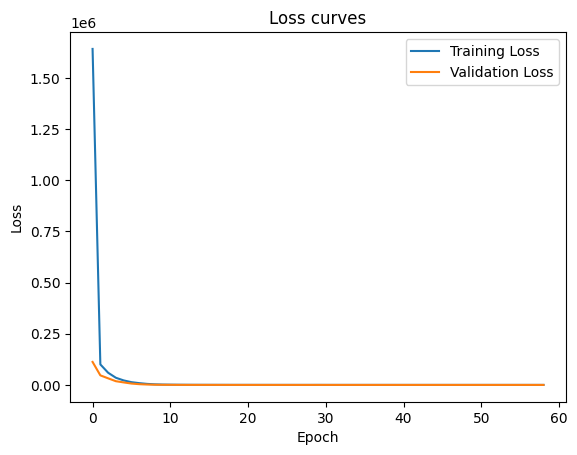

In [82]:
plot_loss(history = history, title="Loss curves")

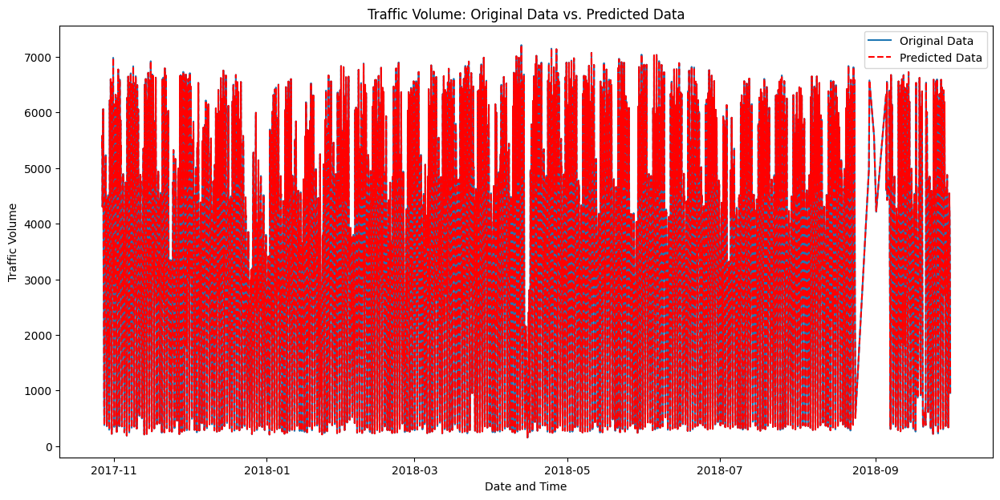

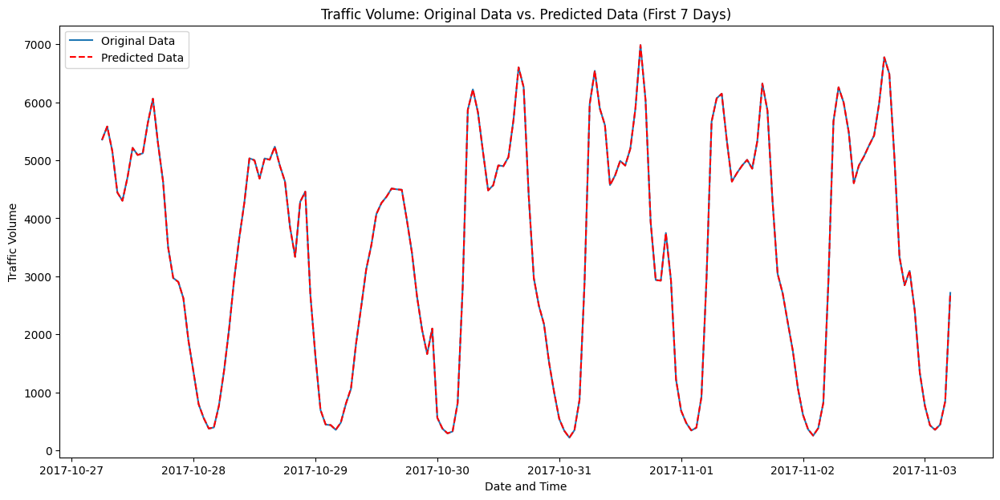

In [83]:
plot_traffic_volume(y_test, y_pred)

using 2 LSTM Layers

In [59]:
# Create an LSTM-based sequential model
model = Sequential([
    # Add an LSTM layer with 128 units, ReLU activation, and return sequences enabled
    LSTM(units=128, activation="relu", return_sequences=True, input_shape=(X_train_reshaped.shape[1], X_train_reshaped.shape[2])),
    # Add another LSTM layer with 64 units and ReLU activation
    LSTM(units=64, activation="relu"),
    # Add a Dense output layer with 1 unit
    Dense(units=1)
], name="LSTM")

model.summary()


Model: "LSTM"
_________________________________________________________________
 Layer (type)                Output Shape              Param #   
 lstm_1 (LSTM)               (None, 1, 128)            131072    
                                                                 
 lstm_2 (LSTM)               (None, 64)                49408     
                                                                 
 dense_1 (Dense)             (None, 1)                 65        
                                                                 
Total params: 180,545
Trainable params: 180,545
Non-trainable params: 0
_________________________________________________________________


Fitting the LSTM using ADAM Optimizer

In [60]:
# Fitting and Predicting the LSTM Model

learning_rate = 0.0001
decay_rate = 1e-5
optimizer = Adam(learning_rate=learning_rate, decay=decay_rate)

model.compile(optimizer = optimizer, loss='mse')

history = model.fit(X_train_reshaped, y_train, epochs=300, batch_size=30, validation_data=(X_val_reshaped, y_val), shuffle = False, verbose = 1, callbacks = [early_stopping, reduce_lr ])

y_pred = model.predict(X_test_reshaped)

print(calc_performance(y_test, y_pred))


Epoch 1/300
899/899 [==============================] - 10s 8ms/step - loss: 2503391.0000 - val_loss: 81547.9219 - lr: 1.0000e-04
Epoch 2/300
899/899 [==============================] - 15s 16ms/step - loss: 107175.6016 - val_loss: 52921.1133 - lr: 1.0000e-04
Epoch 3/300
899/899 [==============================] - 9s 10ms/step - loss: 56404.3047 - val_loss: 24473.8516 - lr: 1.0000e-04
Epoch 4/300
899/899 [==============================] - 9s 10ms/step - loss: 34047.3828 - val_loss: 18904.7227 - lr: 1.0000e-04
Epoch 5/300
899/899 [==============================] - 9s 10ms/step - loss: 19924.8867 - val_loss: 9900.1406 - lr: 1.0000e-04
Epoch 6/300
899/899 [==============================] - 13s 14ms/step - loss: 12528.9238 - val_loss: 5346.5825 - lr: 1.0000e-04
Epoch 7/300
899/899 [==============================] - 10s 11ms/step - loss: 7930.7925 - val_loss: 3843.9080 - lr: 1.0000e-04
Epoch 8/300
899/899 [==============================] - 13s 15ms/step - loss: 5172.7852 - val_loss: 1821.8848 

In [61]:
# Visualizing the Network
model.save('LSTM2_Model.h5')
netron.start('LSTM2_Model.h5')

Serving 'LSTM2_Model.h5' at http://localhost:15712


('localhost', 15712)

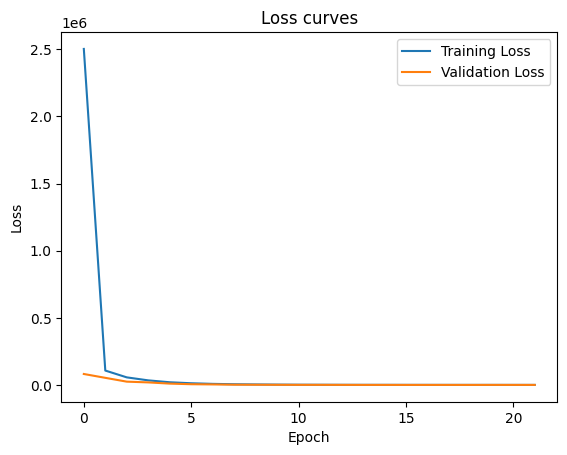

In [62]:
plot_loss(history = history, title="Loss curves")

In [63]:
print(y_test)
print(y_pred)

                     traffic_volume
date_time                          
2017-10-27 06:00:00            5356
2017-10-27 07:00:00            5582
2017-10-27 08:00:00            5159
2017-10-27 09:00:00            4444
2017-10-27 10:00:00            4303
...                             ...
2018-09-30 19:00:00            3543
2018-09-30 20:00:00            2781
2018-09-30 21:00:00            2159
2018-09-30 22:00:00            1450
2018-09-30 23:00:00             954

[7702 rows x 1 columns]
[[5337.073  ]
 [5568.9087 ]
 [5136.784  ]
 ...
 [2147.7095 ]
 [1438.835  ]
 [ 945.44617]]


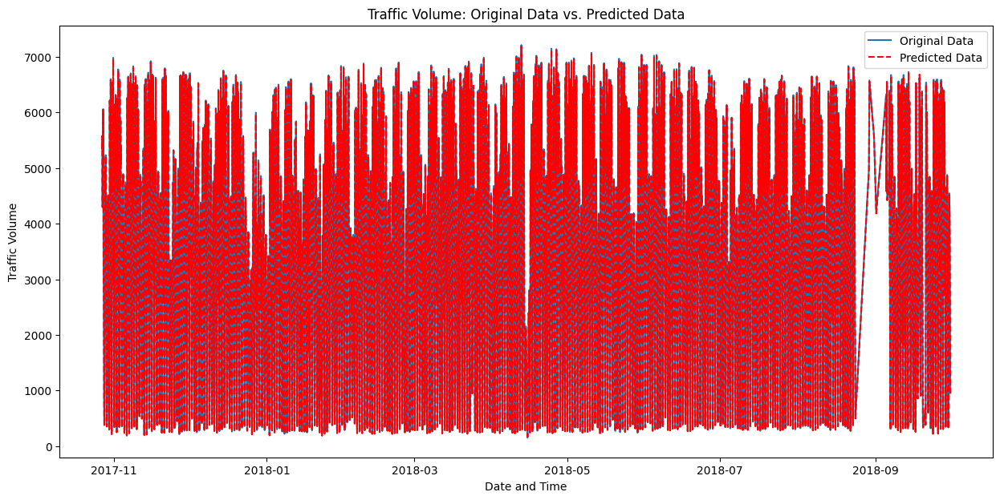

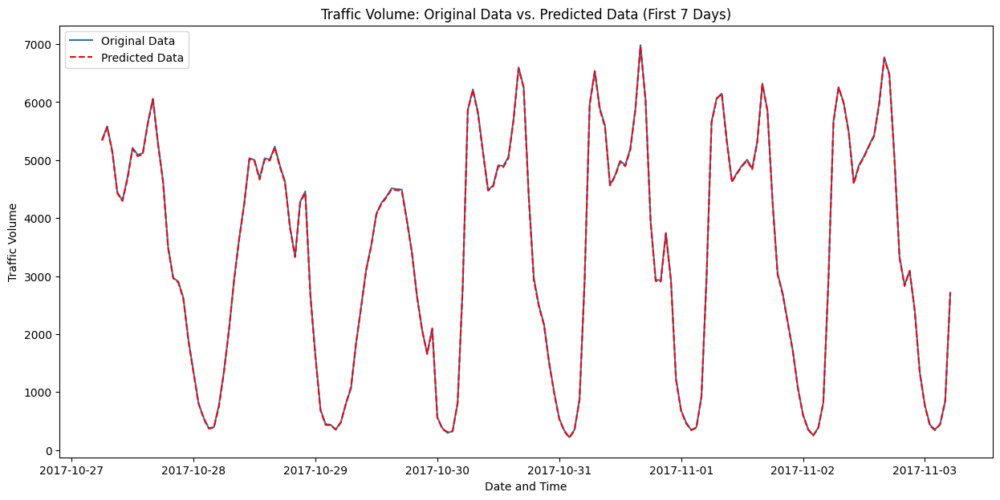

In [64]:
plot_traffic_volume(y_test, y_pred)

# GRU

In [65]:
import numpy as np
import tensorflow as tf
from keras.models import Sequential
from keras.layers import Dense, GRU, Dropout
from sklearn.metrics import mean_absolute_error, mean_squared_error, r2_score
from keras.optimizers import Adam
import matplotlib.pyplot as plt

# Create a GRU-based sequential model
model = Sequential([
    # Add a GRU layer with 128 units, ReLU activation
    GRU(units=128, activation="relu", return_sequences=True, input_shape=(X_train_reshaped.shape[1], X_train_reshaped.shape[2])),
    # Add another GRU layer with 64 units and ReLU activation
    GRU(units=64, activation="relu"),
    # Add a Dense output layer with 1 unit
    Dense(units=1)
], name="GRU")

model.summary()


Model: "GRU"
_________________________________________________________________
 Layer (type)                Output Shape              Param #   
 gru (GRU)                   (None, 1, 128)            98688     
                                                                 
 gru_1 (GRU)                 (None, 64)                37248     
                                                                 
 dense_2 (Dense)             (None, 1)                 65        
                                                                 
Total params: 136,001
Trainable params: 136,001
Non-trainable params: 0
_________________________________________________________________


In [66]:
# Fitting and Predicting using GRU Model

learning_rate = 0.0001
decay_rate = 1e-5
optimizer = Adam(learning_rate=learning_rate, decay=decay_rate)

model.compile(optimizer = optimizer, loss='mse')

history = model.fit(X_train_reshaped, y_train, epochs=100, batch_size=30, validation_data=(X_val_reshaped, y_val), shuffle = False, verbose = 1, callbacks = [early_stopping, reduce_lr])

y_pred = model.predict(X_test_reshaped)

print(calc_performance(y_test, y_pred))


Epoch 1/100
899/899 [==============================] - 11s 9ms/step - loss: 2222058.2500 - val_loss: 112030.6016 - lr: 1.0000e-04
Epoch 2/100
899/899 [==============================] - 6s 7ms/step - loss: 117855.2734 - val_loss: 54912.1602 - lr: 1.0000e-04
Epoch 3/100
899/899 [==============================] - 7s 8ms/step - loss: 58393.1680 - val_loss: 25228.7109 - lr: 1.0000e-04
Epoch 4/100
899/899 [==============================] - 6s 6ms/step - loss: 30587.5332 - val_loss: 14290.8320 - lr: 1.0000e-04
Epoch 5/100
899/899 [==============================] - 7s 8ms/step - loss: 17470.5605 - val_loss: 8327.7422 - lr: 1.0000e-04
Epoch 6/100
899/899 [==============================] - 6s 7ms/step - loss: 10990.9307 - val_loss: 5118.1772 - lr: 1.0000e-04
Epoch 7/100
899/899 [==============================] - 7s 8ms/step - loss: 6660.1768 - val_loss: 3034.9424 - lr: 1.0000e-04
Epoch 8/100
899/899 [==============================] - 6s 7ms/step - loss: 4247.9106 - val_loss: 1888.3829 - lr: 1.00

In [67]:
# Visualizing the Network
model.save('GRU_Model.h5')
netron.start('GRU_Model.h5')

Serving 'GRU_Model.h5' at http://localhost:24826


('localhost', 24826)

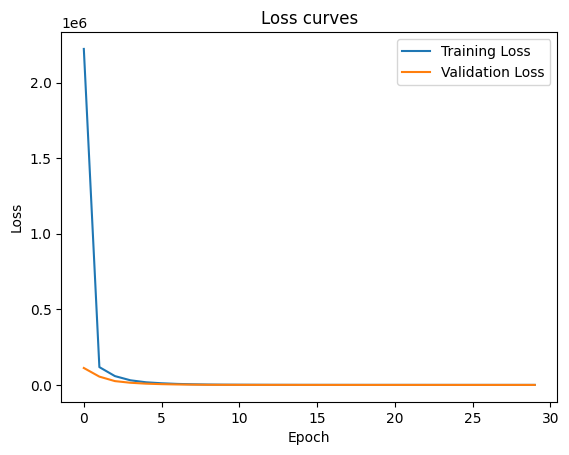

In [68]:
plot_loss(history = history, title="Loss curves")

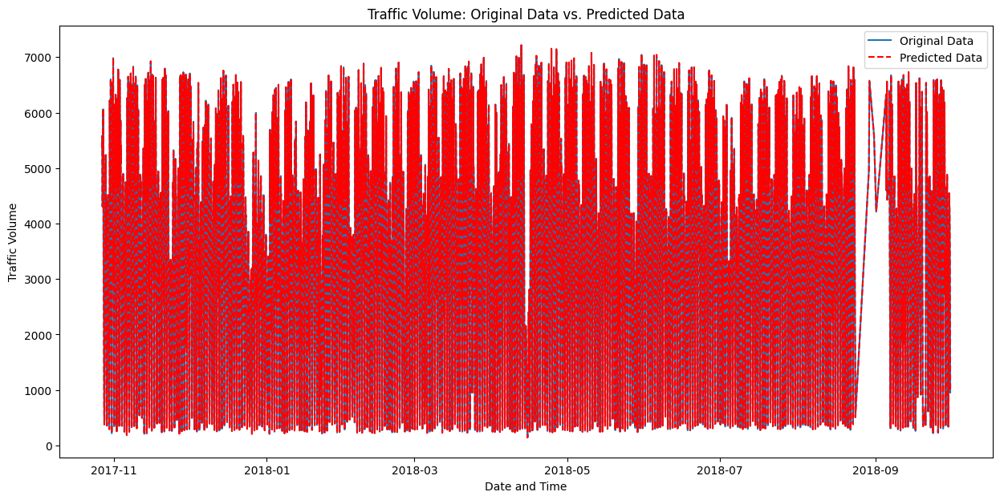

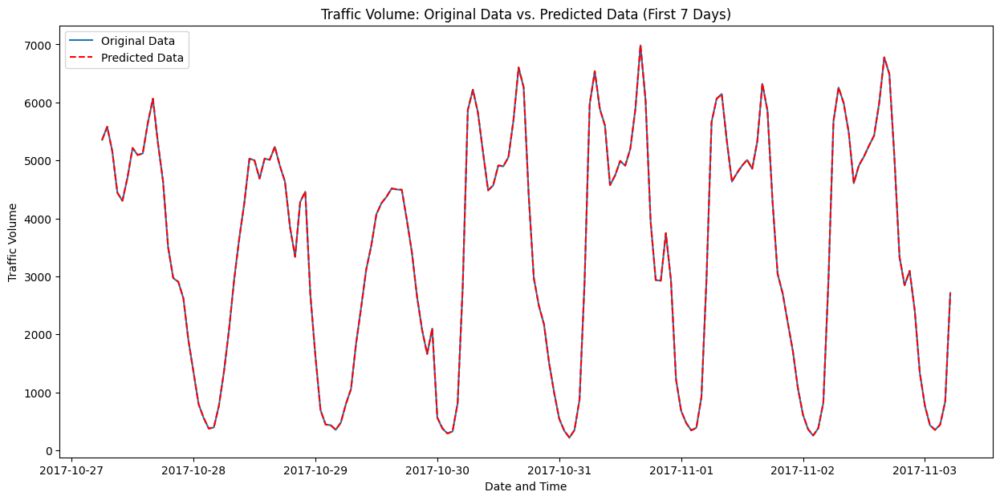

In [69]:
plot_traffic_volume(y_test, y_pred)

# BI-LSTM

To capture past and future information of each element using forward and backward LSTMS

In [89]:
from keras.models import Sequential
from keras.layers import Bidirectional, LSTM, Dense

# Create a bidirectional LSTM-based sequential model
model = Sequential([
    # Add a bidirectional LSTM layer with 128 units, ReLU activation, and return sequences enabled
    Bidirectional(
        LSTM(
            units=128,
            activation="relu",
            return_sequences=True
        ),
        input_shape=(X_train_reshaped.shape[1], X_train_reshaped.shape[2])
    ),
    # Add another bidirectional LSTM layer with 64 units and ReLU activation
    Bidirectional(
        LSTM(
            units=64,
            activation="relu",
        )
    ),
    # Add a Dense output layer with 1 unit
    Dense(units=1)
], name="BiLSTM")

# Print the model summary
model.summary()


Model: "BiLSTM"
_________________________________________________________________
 Layer (type)                Output Shape              Param #   
 bidirectional_3 (Bidirectio  (None, 1, 256)           262144    
 nal)                                                            
                                                                 
 bidirectional_4 (Bidirectio  (None, 128)              164352    
 nal)                                                            
                                                                 
 dense_7 (Dense)             (None, 1)                 129       
                                                                 
Total params: 426,625
Trainable params: 426,625
Non-trainable params: 0
_________________________________________________________________


In [90]:
# Fitting and Prediction using BI-LSTM Model

learning_rate = 0.0001
decay_rate = 1e-5
optimizer = Adam(learning_rate=learning_rate, decay=decay_rate)

model.compile(optimizer = optimizer, loss='mse')

history = model.fit(X_train_reshaped, y_train, epochs=300, batch_size=30, validation_data=(X_val_reshaped, y_val), shuffle = False, verbose = 1, callbacks = [early_stopping, reduce_lr ])

y_pred = model.predict(X_test_reshaped)

print(calc_performance(y_test, y_pred))


Epoch 1/300
899/899 [==============================] - 23s 18ms/step - loss: 2172651.0000 - val_loss: 97428.6406 - lr: 1.0000e-04
Epoch 2/300
899/899 [==============================] - 15s 16ms/step - loss: 88293.6172 - val_loss: 48378.5000 - lr: 1.0000e-04
Epoch 3/300
899/899 [==============================] - 15s 17ms/step - loss: 46212.8125 - val_loss: 21107.4980 - lr: 1.0000e-04
Epoch 4/300
899/899 [==============================] - 16s 18ms/step - loss: 25430.5879 - val_loss: 13522.4668 - lr: 1.0000e-04
Epoch 5/300
899/899 [==============================] - 15s 16ms/step - loss: 15247.9463 - val_loss: 8224.4561 - lr: 1.0000e-04
Epoch 6/300
899/899 [==============================] - 15s 17ms/step - loss: 11135.7588 - val_loss: 5585.3521 - lr: 1.0000e-04
Epoch 7/300
899/899 [==============================] - 15s 16ms/step - loss: 6770.9683 - val_loss: 3484.0947 - lr: 1.0000e-04
Epoch 8/300
899/899 [==============================] - 15s 17ms/step - loss: 4444.8545 - val_loss: 2079.22

In [91]:
# Visualizing the Network
model.save('BI-LSTM_Model.h5')
netron.start('BI-LSTM_Model.h5')

Serving 'BI-LSTM_Model.h5' at http://localhost:19166


('localhost', 19166)

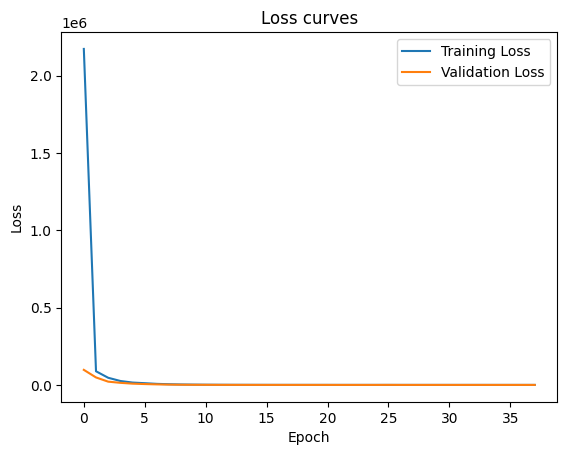

In [92]:
plot_loss(history = history, title="Loss curves")

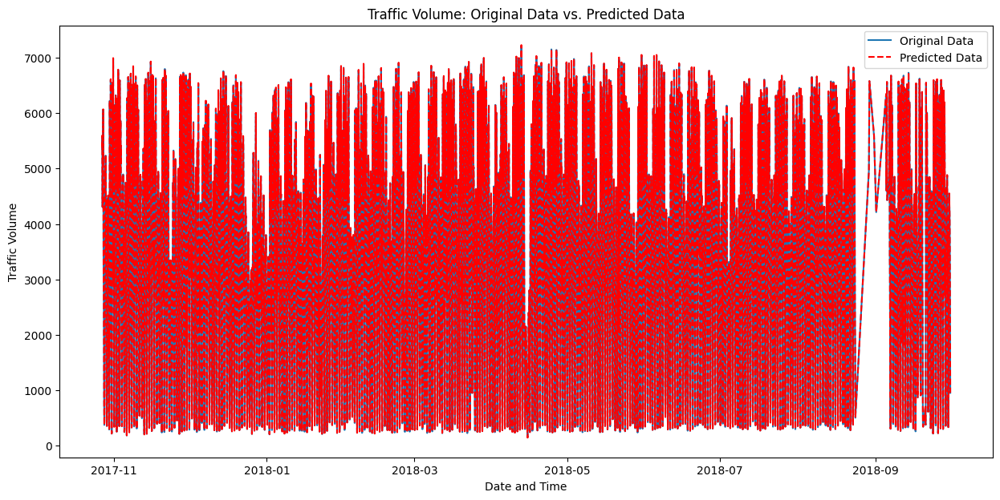

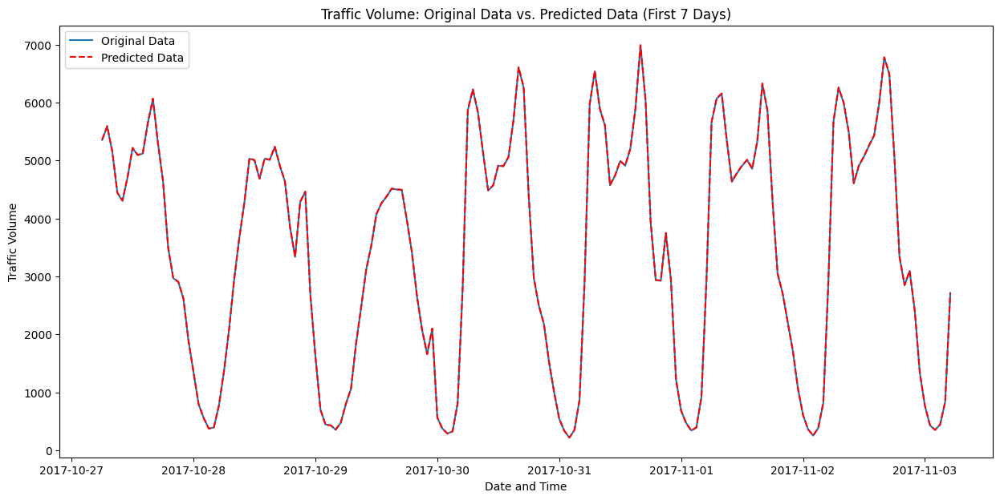

In [93]:
plot_traffic_volume(y_test, y_pred)

# CNN-LSTM

In this code, we have added a Conv1D layer and a MaxPooling1D layer before the LSTM layers. This allows the model to learn both spatial (CNN) and temporal (LSTM) features from the input data. 

In [75]:
import numpy as np
import tensorflow as tf
from keras.models import Sequential
from keras.layers import Dense, LSTM, Dropout, Conv1D, MaxPooling1D
from sklearn.metrics import mean_absolute_error, mean_squared_error, r2_score
from keras.optimizers import Adam
import matplotlib.pyplot as plt

# Create a sequential model with a Conv1D layer followed by MaxPooling1D, LSTM, and Dense layers
model = Sequential([
    # Add a Conv1D layer with 64 filters, kernel size of 1, and ReLU activation
    Conv1D(filters=64, kernel_size=1, activation='relu', input_shape=(X_train_reshaped.shape[1], X_train_reshaped.shape[2])),
    # Add a MaxPooling1D layer with a pool size of 1
    MaxPooling1D(pool_size=1),
    # Add an LSTM layer with 64 units and ReLU activation
    LSTM(units=64, activation='relu'),
    # Add a Dense output layer with 1 unit
    Dense(units=1)
])

# Compile the model with the Adam optimizer and mean squared error loss function
model.compile(optimizer='adam', loss='mse')


model.summary()


Model: "sequential"
_________________________________________________________________
 Layer (type)                Output Shape              Param #   
 conv1d (Conv1D)             (None, 1, 64)             8192      
                                                                 
 max_pooling1d (MaxPooling1D  (None, 1, 64)            0         
 )                                                               
                                                                 
 lstm_5 (LSTM)               (None, 64)                33024     
                                                                 
 dense_4 (Dense)             (None, 1)                 65        
                                                                 
Total params: 41,281
Trainable params: 41,281
Non-trainable params: 0
_________________________________________________________________


In [76]:
# Fitting and Predicting using CNN-LSTM Model

learning_rate = 0.0001
decay_rate = 1e-5
optimizer = Adam(learning_rate=learning_rate, decay=decay_rate)

model.compile(optimizer = optimizer, loss='mse')

history = model.fit(X_train_reshaped, y_train, epochs=30, batch_size=30, validation_data=(X_val_reshaped, y_val), shuffle = False, verbose = 1, callbacks = [early_stopping, reduce_lr ])

y_pred = model.predict(X_test_reshaped)

print(calc_performance(y_test, y_pred))

Epoch 1/30
899/899 [==============================] - 7s 5ms/step - loss: 1540622.8750 - val_loss: 149959.2656 - lr: 1.0000e-04
Epoch 2/30
899/899 [==============================] - 4s 4ms/step - loss: 119674.3828 - val_loss: 45135.3242 - lr: 1.0000e-04
Epoch 3/30
899/899 [==============================] - 4s 5ms/step - loss: 53347.2773 - val_loss: 27685.7441 - lr: 1.0000e-04
Epoch 4/30
899/899 [==============================] - 5s 5ms/step - loss: 28339.9219 - val_loss: 11616.7939 - lr: 1.0000e-04
Epoch 5/30
899/899 [==============================] - 4s 4ms/step - loss: 15861.7002 - val_loss: 9868.5439 - lr: 1.0000e-04
Epoch 6/30
899/899 [==============================] - 4s 5ms/step - loss: 8761.1465 - val_loss: 3416.9404 - lr: 1.0000e-04
Epoch 7/30
899/899 [==============================] - 5s 5ms/step - loss: 5282.5801 - val_loss: 2300.6289 - lr: 1.0000e-04
Epoch 8/30
899/899 [==============================] - 4s 4ms/step - loss: 3029.0232 - val_loss: 1332.9417 - lr: 1.0000e-04
Epo

In [77]:
# Visualizing the Network
model.save('CNN-LSTM_Model.h5')
netron.start('CNN-LSTM_Model.h5')

Serving 'CNN-LSTM_Model.h5' at http://localhost:23615


('localhost', 23615)

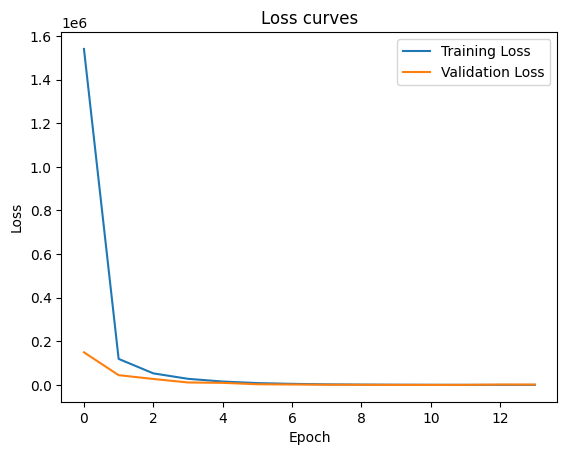

In [78]:
plot_loss(history = history, title="Loss curves")

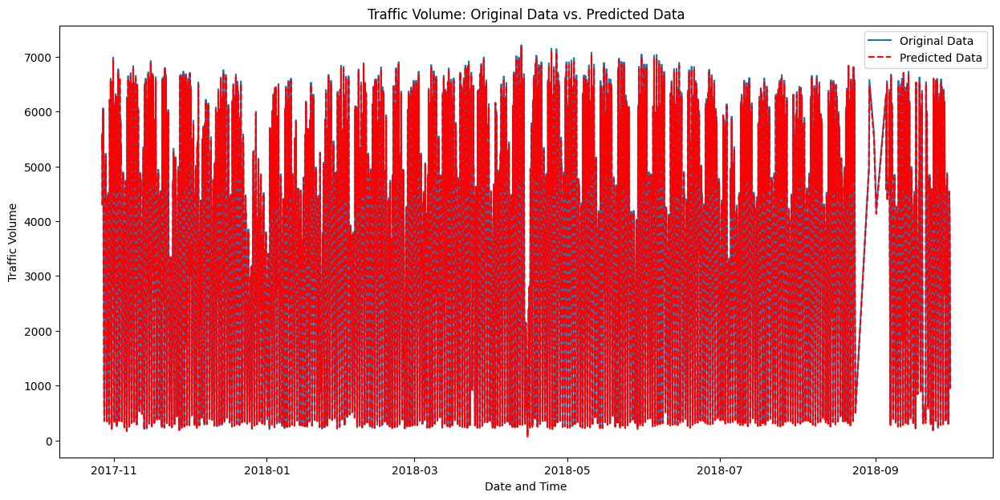

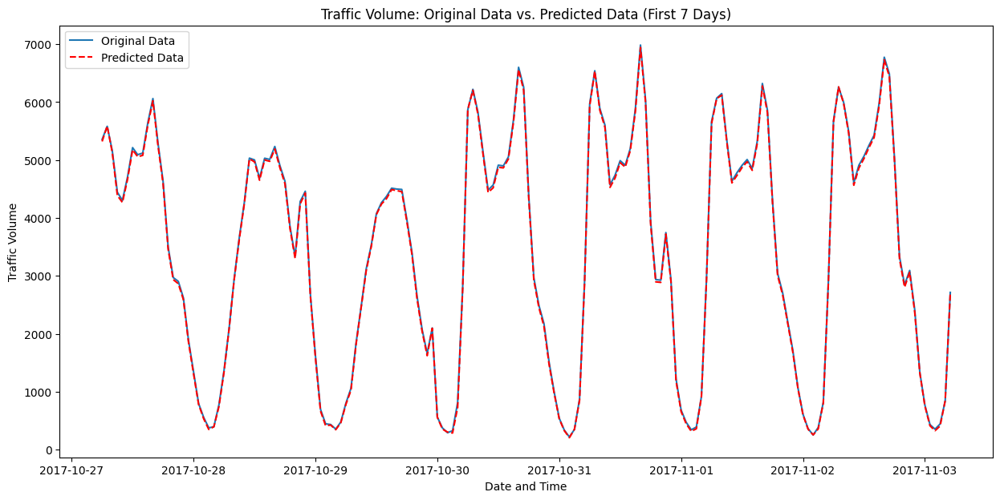

In [79]:
plot_traffic_volume(y_test, y_pred)